# Next Stop: Rail-Induced Displacement of Immigrant Communities?
## Arroyo Seco Collective
### By Erik Felix and Kevin Liu

With Measure R’s passage in 2008, and Measure M’s passage in 2016,  LA Metro has been heavily investing in light rail. Metro’s L Line is a prime example. Completed in 2009 and cross cutting through both immigrant communities and wealthy white communities, the L Line traverses a particularly diverse segment of Los Angeles County making it a prime candidate for study. <br>

<em>Research question</em>: did Metro’s construction of the L Line through Pasadena, Highland Park, Chinatown, Boyle Heights, and East Los Angeles have a measurable impact on exacerbating displacement of foreign-born households who lived near the station? Or, is the trend around the station similar to trends happening neighborhood-wide?
<br>
<br>
To do this, we use the 2011 and 2019 ACS survey and hone in on the datapoint, Year of Entry Foreign Born. We use this datapoint to follow foreign born population trends. The 2011 ACS asks if a foreign born resident entered the country before or after 2000. The 2019 ACS asks if a foreign born resident entered the country before or after 2010, which aligns closely with the 2009 opening of the L Line’s extension into Chinatown and East LA. Understanding if recent immigrants are havng a harder, similar, or easier time living in the census tracts in the station area provides insight into the potential effect the rail investment may have on immigrant communities. 

In [2]:
# Let's start by importing all of the libraries we'll need for our analyses

import pandas as pd

import geopandas as gpd

import contextily as ctx

import matplotlib.pyplot as plt

# for interactive plots
import plotly.express as px

# for network analysis
import networkx as nx

# for street network analysis
import osmnx as ox

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [3]:
# Importing our 2019 ACS 5 Year Foreign Born Population Year of Entry divided by Census tract GeoJson dataset

df = gpd.read_file('acs2019_5yr_B05015_14000US06037222001.geojson')

In [4]:
# Importing our 2019 ACS 5 Year Total Population divided by Census tract GeoJson dataset 

dft = gpd.read_file('acs2019_5yr_B01003_14000US06037222001.geojson')

In [5]:
# Simple merge given that all of our Census tracts match up

df = pd.merge(df, dft)

In [6]:
# Checking our merge

df.head()

,geoid,name,B05015001,"B05015001, Error",B05015002,"B05015002, Error",B05015003,"B05015003, Error",B05015004,"B05015004, Error",...,"B05015028, Error",B05015029,"B05015029, Error",B05015030,"B05015030, Error",B05015031,"B05015031, Error",geometry,B01003001,"B01003001, Error"
0,05000US06037,"Los Angeles County, CA",3430507.0,14119.0,288054.0,4584.0,76162.0,2634.0,211892.0,3307.0,...,2277.0,989775.0,8062.0,173834.0,3797.0,815941.0,6993.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033...",10081570.0,0.0
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",1424.0,326.0,13.0,25.0,0.0,12.0,13.0,25.0,...,12.0,910.0,256.0,130.0,79.0,780.0,249.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",4283.0,443.0
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",810.0,180.0,0.0,12.0,0.0,12.0,0.0,12.0,...,12.0,690.0,149.0,36.0,36.0,654.0,140.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",3405.0,334.0
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",3167.0,438.0,0.0,17.0,0.0,17.0,0.0,17.0,...,17.0,2054.0,299.0,198.0,182.0,1856.0,279.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",6347.0,484.0
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",1749.0,251.0,0.0,12.0,0.0,12.0,0.0,12.0,...,12.0,1120.0,252.0,147.0,118.0,973.0,226.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",3702.0,276.0


In [7]:
# Dropping margin of error

df = df.drop(columns=['B05015001, Error', 
                 'B05015002, Error', 
                 'B05015003, Error', 
                 'B05015004, Error', 
                 'B05015005, Error', 
                 'B05015006, Error', 
                 'B05015007, Error', 
                 'B05015008, Error', 
                 'B05015009, Error', 
                 'B05015010, Error', 
                 'B05015011, Error',
                 'B05015012, Error', 
                 'B05015013, Error', 
                 'B05015014, Error',
                 'B05015015, Error',
                 'B05015016, Error',
                 'B05015017, Error',
                 'B05015018, Error',
                 'B05015019, Error',
                 'B05015020, Error',
                 'B05015021, Error',
                 'B05015022, Error',
                 'B05015023, Error',
                 'B05015024, Error',
                 'B05015025, Error',
                 'B05015026, Error',
                 'B05015027, Error',
                 'B05015028, Error',
                 'B05015029, Error',
                 'B05015030, Error',
                 'B05015031, Error',
                 'B01003001, Error'])


In [8]:
# Renaming our columns according to the metadata file

df.columns = [
 'geoid',
 'name',
 'Total Foreign Born',
 'China, Hong Kong, Taiwan',
 'China et al Entered 2010 or later',
 'China et al Before 2010',
 'Cuba',
 'Cuba Entered 2010 or later',
 'Cuba Entered Before 2010',
 'Dominican Republic',
 'D.R. Entered 2010 or later',
 'D.R. Entered Before 2010',
 'El Salvador',
 'E.S. Entered 2010 or later',
 'E.S. Entered Before 2010',        
 'Guatemala',
 'Guatemala Entered 2010 or later',
 'Guatemala Entered Before 2010',   
 'India',
 'India Entered 2010 or later',
 'India Entered Before 2010', 
 'Mexico',
 'Mexico Entered 2010 or later',
 'Mexico Entered Before 2010', 
 'Philippines',
 'Philippines Entered 2010 or later',
 'Philippines Entered Before 2010', 
 'Vietnam',
 'Vietnam Entered 2010 or later',
 'Vietnam Entered Before 2010', 
 'All Other Countries',
 'A.O.C. Entered 2010 or later',
 'A.O.C. Entered Before 2010', 
 'geometry',
 'Total Population']

In [9]:
# Checking for new titles!

df.head()

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,...,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population
0,05000US06037,"Los Angeles County, CA",3430507.0,288054.0,76162.0,211892.0,17332.0,1356.0,15976.0,12687.0,...,31931.0,207873.0,98409.0,10841.0,87568.0,989775.0,173834.0,815941.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033...",10081570.0
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",1424.0,13.0,0.0,13.0,8.0,0.0,8.0,0.0,...,61.0,111.0,0.0,0.0,0.0,910.0,130.0,780.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",4283.0
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",810.0,0.0,0.0,0.0,0.0,0.0,0.0,18.0,...,0.0,78.0,0.0,0.0,0.0,690.0,36.0,654.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",3405.0
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",3167.0,0.0,0.0,0.0,0.0,0.0,0.0,53.0,...,0.0,76.0,0.0,0.0,0.0,2054.0,198.0,1856.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",6347.0
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",1749.0,0.0,0.0,0.0,29.0,0.0,29.0,36.0,...,12.0,67.0,0.0,0.0,0.0,1120.0,147.0,973.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",3702.0


In [10]:
# Adding our Percent Foreign Born Column

PercentForeign = (df['Total Foreign Born']/df['Total Population'])*100

In [11]:
df['Percent Foreign Born'] = PercentForeign

In [12]:
# Checking columns

df.head()

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,...,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
0,05000US06037,"Los Angeles County, CA",3430507.0,288054.0,76162.0,211892.0,17332.0,1356.0,15976.0,12687.0,...,207873.0,98409.0,10841.0,87568.0,989775.0,173834.0,815941.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033...",10081570.0,34.027508
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",1424.0,13.0,0.0,13.0,8.0,0.0,8.0,0.0,...,111.0,0.0,0.0,0.0,910.0,130.0,780.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",4283.0,33.247724
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",810.0,0.0,0.0,0.0,0.0,0.0,0.0,18.0,...,78.0,0.0,0.0,0.0,690.0,36.0,654.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",3405.0,23.788546
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",3167.0,0.0,0.0,0.0,0.0,0.0,0.0,53.0,...,76.0,0.0,0.0,0.0,2054.0,198.0,1856.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",6347.0,49.897589
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",1749.0,0.0,0.0,0.0,29.0,0.0,29.0,36.0,...,67.0,0.0,0.0,0.0,1120.0,147.0,973.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",3702.0,47.244733


Now that we've got our two tables merged and our columns titled, let's move on to creating some maps.

### Percentage of Foreign Born Population in Metro L Line Del Mar Station Walkshed

Using 2019 ACS 5 Year data, we will be creating a chorpleth map of the census tracts showing the percentage of foreign born populations within a 10 minute walk from the Del Mar Station. We will overlay this data with a isochrone map of the walkshed (10 minute walking distance) around Del Mar Station.

In [13]:
# Let's start by orienting ourselves around the Del Mar Station by calling for it by address in osmnx

address = 'Del Mar, South Raymond Avenue, Old Pasadena, Pasadena, Los Angeles County, California, 91105, United States'
network_type = 'walk'
trip_times = [10] #in minutes
meters_per_minute = 80 # travel distance per minute

In [14]:
%%time
# %%time is a magic command to see how long it takes this cell to run 

# download the street network
G = ox.graph_from_address(address, network_type=network_type, dist = 1500)

CPU times: user 3.26 s, sys: 68.4 ms, total: 3.33 s
Wall time: 3.72 s


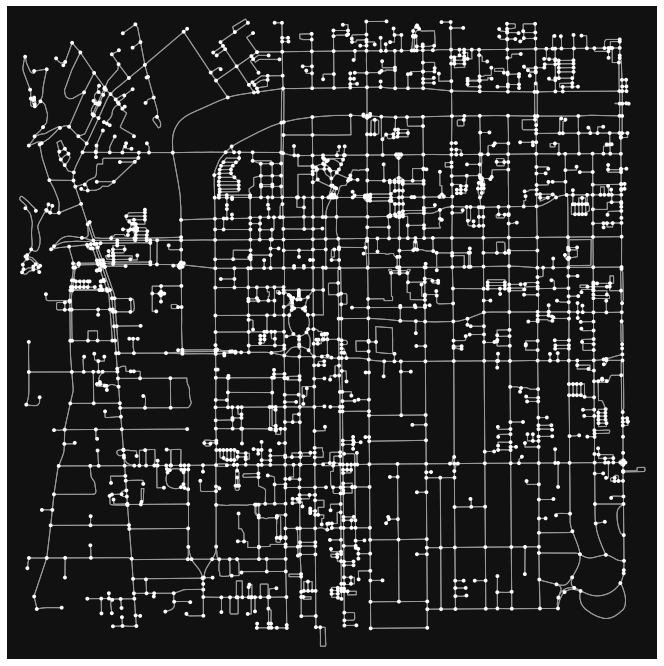

In [15]:
fig, ax = ox.plot_graph(G,figsize=(12,12))

In [16]:
G = ox.project_graph(G, to_crs='epsg:3857')

In [17]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

In [18]:
gdf_nodes.head()

,y,x,highway,street_count,lon,lat,geometry
osmid,,,,,,,
14963716,4.049279e+06,-1.315043e+07,traffic_signals,4,-118.132316,34.152361,POINT (-13150429.308 4049278.739)
6784510760,4.049278e+06,-1.315040e+07,NaN,3,-118.132087,34.152358,POINT (-13150403.793 4049278.403)
3892769467,4.049279e+06,-1.315045e+07,traffic_signals,4,-118.132468,34.152362,POINT (-13150446.139 4049278.941)
1995207967,4.049204e+06,-1.315043e+07,NaN,4,-118.132311,34.151805,POINT (-13150428.729 4049204.015)
6784510757,4.049306e+06,-1.315043e+07,NaN,3,-118.132316,34.152564,POINT (-13150429.308 4049306.141)


<AxesSubplot:>

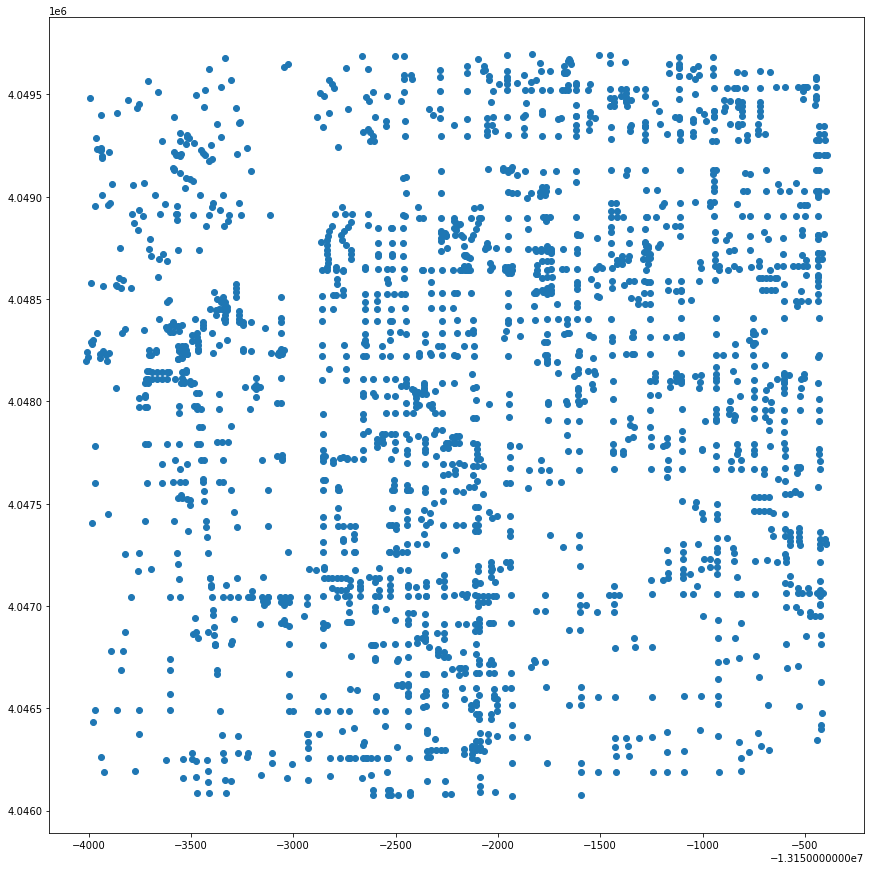

In [19]:
gdf_nodes.plot(figsize=(15,15))

In [20]:
gdf_edges.head()

osmid  oneway               name  \
u          v          key                                                      
14963716   6784510760 0                 405328940   False       Maple Street   
           3892769467 0                 607802969   False       Maple Street   
           1995207967 0    [173415946, 173415947]   False  North Lake Avenue   
           6784510757 0                 385937988   False  North Lake Avenue   
6784510760 14963716   0                 405328940   False       Maple Street   

                             highway  length  \
u          v          key                      
14963716   6784510760 0      primary  21.093   
           3892769467 0      primary  13.914   
           1995207967 0    secondary  61.772   
           6784510757 0    secondary  22.659   
6784510760 14963716   0      primary  21.093   

                                                                    geometry  \
u          v          key                                                      
14963716   6784510760 0    LINESTRING (-13150429.308 4049278.739, -131504...   
           3892769467 0    LINESTRING (-13150429.308 4049278.739, -131504...   
           1995207967 0    LINESTRING (-13150429.308 4049278.739, -131504...   
           6784510757 0    LINESTRING (-13150429.308 4049278.739, -131504...   
6784510760 14963716   0    LINESTRING (-13150403.793 4049278.403, -131504...   

                          maxspeed bridge lanes access service  ref tunnel  \
u          v          key                                                    
14963716   6784510760 0        NaN    NaN   NaN    NaN     NaN  NaN    NaN   
           3892769467 0        NaN    NaN   NaN    NaN     NaN  NaN    NaN   
           1995207967 0     35 mph    yes   NaN    NaN     NaN  NaN    NaN   
           6784510757 0     35 mph    NaN   NaN    NaN     NaN  NaN    NaN   
6784510760 14963716   0        NaN    NaN   NaN    NaN     NaN  NaN    NaN   

                          width  
u          v          key        
14963716   6784510760 0     NaN  
           3892769467 0     NaN  
           1995207967 0     NaN  
           6784510757 0     NaN  
6784510760 14963716   0     NaN

<AxesSubplot:>

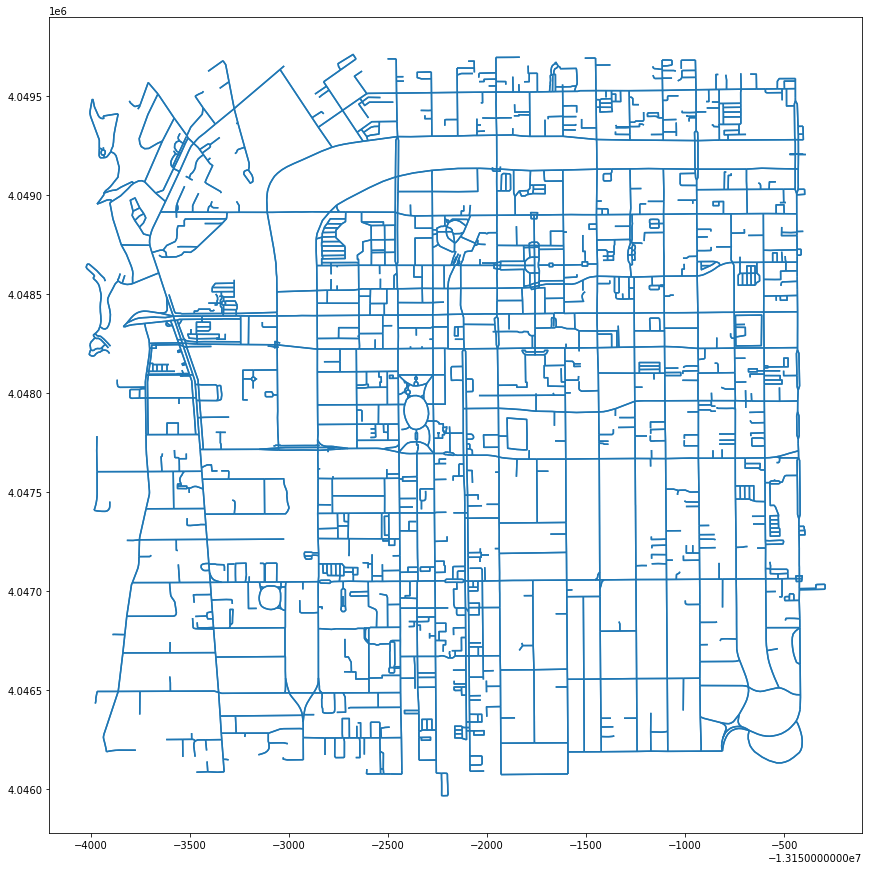

In [21]:
gdf_edges.plot(figsize=(15,15))

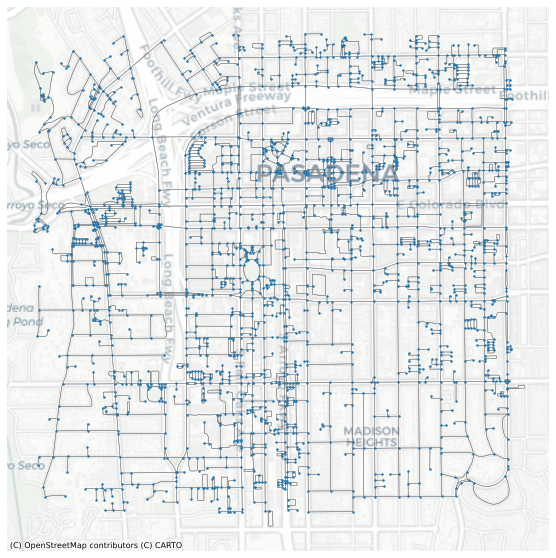

In [22]:
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(10,10))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gray', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax, 
               markersize=2, 
               zorder=20)


# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,zoom=14)

In [23]:
# get the bounding box coordinates
minx, miny, maxx, maxy = gdf_nodes.geometry.total_bounds
print(minx)
print(miny)
print(maxx)
print(maxy)

-13154010.901174664
4046072.998110596
-13150391.069632793
4049695.185661036


In [24]:
# calculate the centroid
centroid_x = (maxx-minx)/2 + minx
centroid_y = (maxy-miny)/2 + miny
print(centroid_x)
print(centroid_y)

-13152200.985403728
4047884.0918858163


In [25]:
# use osmnx's distance.nearest_nodes command to get the id for the nearest node
center_node = ox.distance.nearest_nodes(G,Y=centroid_y,X=centroid_x)
print('The id for the nearest node is ' + str(center_node))

The id for the nearest node is 1995241213


In [26]:
# what is this record?
gdf_nodes.loc[[center_node]]

,y,x,highway,street_count,lon,lat,geometry
osmid,,,,,,,
1995241213,4.047831e+06,-1.315221e+07,NaN,1,-118.148271,34.141596,POINT (-13152205.321 4047830.780)


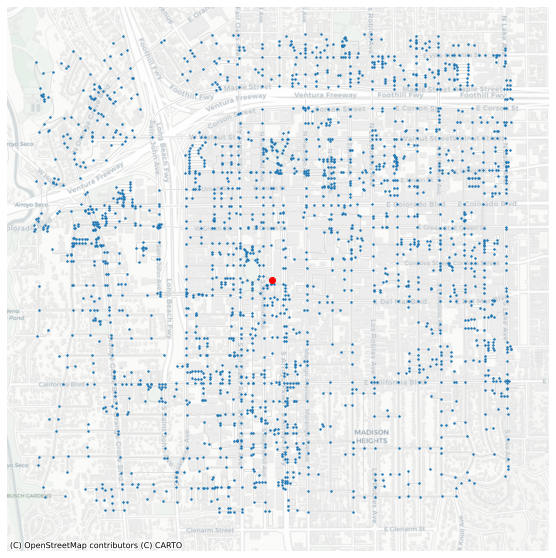

In [27]:
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(10,10))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gainsboro', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax, 
               markersize=2, 
               zorder=20)

# add the center node in red also to ax
gdf_nodes.loc[[center_node]].plot(ax=ax,
                                  color='r', 
                                  zorder=30)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [28]:
gdf_edges.sample(5)

,,,osmid,oneway,name,highway,length,geometry,maxspeed,bridge,lanes,access,service,ref,tunnel,width
u,v,key,,,,,,,,,,,,,,
1995241083,1919958788,0,181582599,False,Fillmore Street,pedestrian,25.868,"LINESTRING (-13152189.748 4046661.966, -131521...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
647076462,4796075779,0,463186028,False,NaN,footway,13.598,"LINESTRING (-13152410.695 4048054.738, -131524...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3823850483,601845075,0,166979312,False,South Saint John Avenue,secondary,120.413,"LINESTRING (-13153019.523 4046669.026, -131530...",NaN,NaN,NaN,NaN,NaN,CA 710,NaN,NaN
2430651625,2430651639,0,234948532,False,NaN,service,59.274,"LINESTRING (-13152182.835 4048644.252, -131521...",NaN,NaN,NaN,NaN,parking_aisle,NaN,NaN,NaN
6785792893,122679313,0,13297253,False,Congress Place,residential,66.233,"LINESTRING (-13153301.941 4046812.417, -131533...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
gdf_edges['walk_time'] = (gdf_edges['length']/meters_per_minute)

In [30]:
gdf_edges.sample(5)

,,,osmid,oneway,name,highway,length,geometry,maxspeed,bridge,lanes,access,service,ref,tunnel,width,walk_time
u,v,key,,,,,,,,,,,,,,,
581324991,2430651625,0,17212319,False,Holly Street,residential,29.273,"LINESTRING (-13152218.245 4048644.279, -131521...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.365912
6726873536,6726873541,0,13444217,False,North El Molino Avenue,tertiary,32.313,"LINESTRING (-13150941.288 4048826.084, -131509...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.403912
5572501439,5572501440,0,582748445,False,NaN,service,72.004,"LINESTRING (-13152152.545 4049640.798, -131520...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.900050
6734880832,6734880836,0,717086042,False,NaN,service,35.045,"LINESTRING (-13150828.411 4049344.101, -131508...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.438062
6731028447,6731028459,0,629454876,False,El Molino Avenue,tertiary,42.920,"LINESTRING (-13150947.945 4049628.651, -131509...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.536500


In [31]:
# assign a color hex code for each trip time isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), 
                                cmap='plasma', 
                                start=0, 
                                return_hex=True)
print(trip_times)
print(iso_colors)

[10]
['#0d0887']


In [32]:
time_color = list(zip(trip_times, iso_colors))
time_color

[(10, '#0d0887')]

In [33]:
for time, color in list(time_color):

    # for each trip time, create an egograph of nodes that fall within that distance
    subgraph = nx.ego_graph(G, 1995241213, radius=time)

    print('There are ' + str(len(subgraph.nodes())) + ' nodes within ' + str(time) + ' minutes ')
    
    # for each of those nodes, update the gdf_nodes dataframe and assign it with its associated distance color
    for node in subgraph.nodes():
        gdf_nodes.loc[node,'time'] = str(time) + ' mins'
        gdf_nodes.loc[node,'color'] = color

There are 179 nodes within 10 minutes 


In [34]:
gdf_nodes.sample(30)

,y,x,highway,street_count,lon,lat,geometry,time,color
osmid,,,,,,,,,
8406800539,4.048158e+06,-1.315274e+07,NaN,3,-118.153104,34.144028,POINT (-13152743.417 4048157.848),NaN,NaN
1446791857,4.048098e+06,-1.315351e+07,NaN,3,-118.159948,34.143583,POINT (-13153505.232 4048098.061),NaN,NaN
9000205691,4.047019e+06,-1.315205e+07,NaN,3,-118.146853,34.135558,POINT (-13152047.493 4047018.710),NaN,NaN
122663848,4.046191e+06,-1.315092e+07,NaN,4,-118.136727,34.129404,POINT (-13150920.294 4046191.085),NaN,NaN
1784830605,4.047392e+06,-1.315286e+07,NaN,3,-118.154117,34.138331,POINT (-13152856.140 4047391.605),NaN,NaN
6731028446,4.049605e+06,-1.315116e+07,NaN,1,-118.138907,34.154786,POINT (-13151162.981 4049604.922),NaN,NaN
1447308407,4.048500e+06,-1.315337e+07,NaN,1,-118.158742,34.146571,POINT (-13153371.003 4048499.884),NaN,NaN
6790055312,4.048582e+06,-1.315161e+07,NaN,3,-118.142948,34.147181,POINT (-13151612.779 4048582.028),NaN,NaN
7882800489,4.047076e+06,-1.315253e+07,NaN,3,-118.151179,34.135984,POINT (-13152529.083 4047075.976),NaN,NaN


In [35]:
gdf_nodes['color'].fillna('#cccccc', inplace=True)

In [36]:
gdf_nodes.sample(5)

,y,x,highway,street_count,lon,lat,geometry,time,color
osmid,,,,,,,,,
6817451389,4.048505e+06,-1.315135e+07,NaN,3,-118.140591,34.146611,POINT (-13151350.388 4048505.358),NaN,#cccccc
6734880832,4.049344e+06,-1.315083e+07,NaN,3,-118.135902,34.152847,POINT (-13150828.411 4049344.101),NaN,#cccccc
122937455,4.048525e+06,-1.315259e+07,NaN,3,-118.151725,34.146758,POINT (-13152589.908 4048525.077),NaN,#cccccc
122679313,4.046812e+06,-1.315338e+07,NaN,3,-118.158841,34.134020,POINT (-13153382.046 4046811.852),NaN,#cccccc
601848086,4.047908e+06,-1.315175e+07,NaN,3,-118.144212,34.142168,POINT (-13151753.576 4047907.714),10 mins,#0d0887


<AxesSubplot:>

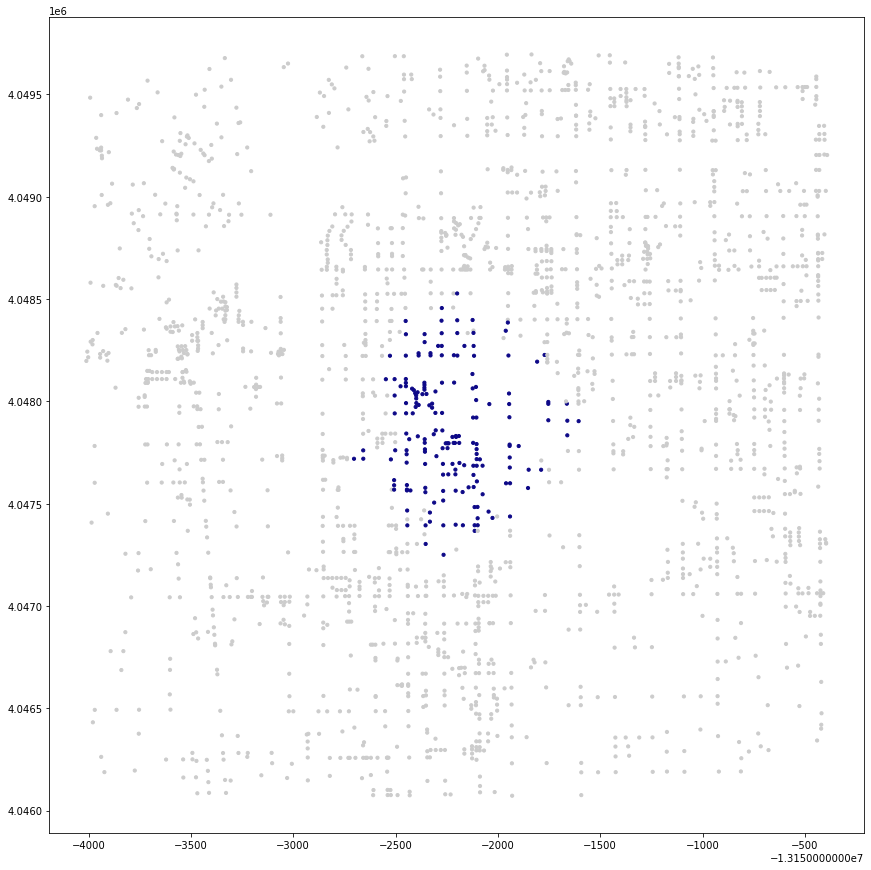

In [37]:
#plotting and taking a look at my nodes within the walkshed
gdf_nodes.plot(figsize=(15,15),
               color=gdf_nodes['color'],
               markersize=10)

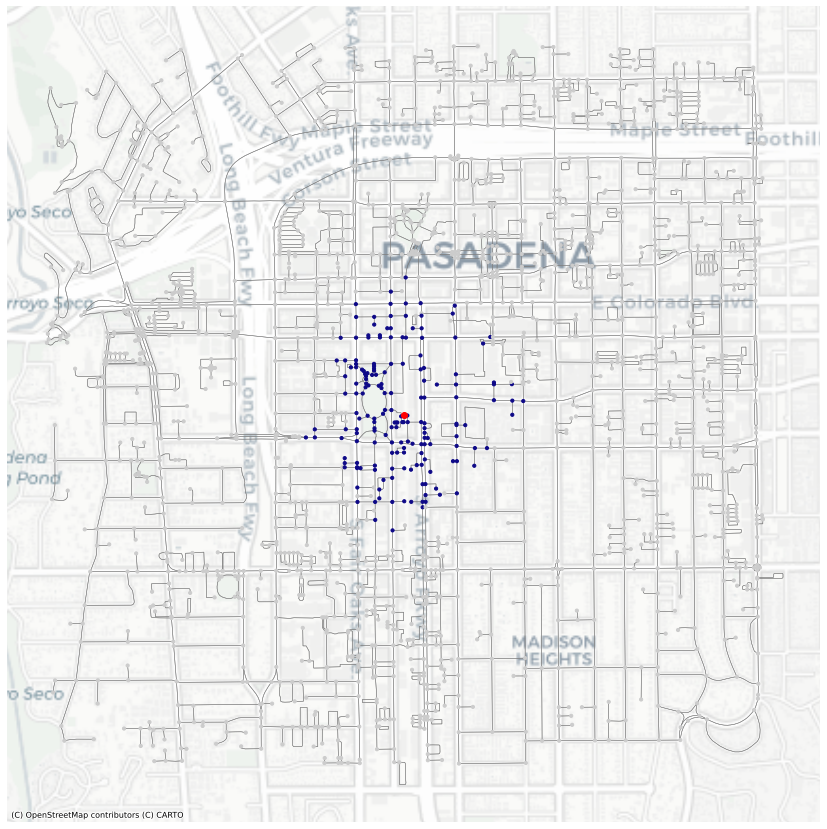

In [38]:
# a "full" map
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(15,15))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gray', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax,
               color=gdf_nodes['color'],
               markersize=10, 
               zorder=20)

# marking the station site with a red dot. Grabbed the station's node from OpenStreet Maps
gdf_nodes.loc[[1995241213]].plot(ax=ax,
                                  color='r', 
                                  zorder=30)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,zoom=14)

In [39]:
gdf_nodes[gdf_nodes['time']=='10 mins']

,y,x,highway,street_count,lon,lat,geometry,time,color
osmid,,,,,,,,,
16218739,4.048393e+06,-1.315245e+07,traffic_signals,4,-118.150475,34.145775,POINT (-13152450.736 4048392.897),10 mins,#0d0887
122575436,4.048394e+06,-1.315228e+07,traffic_signals,4,-118.148901,34.145787,POINT (-13152275.453 4048394.443),10 mins,#0d0887
122615775,4.048328e+06,-1.315245e+07,NaN,3,-118.150464,34.145293,POINT (-13152449.467 4048328.011),10 mins,#0d0887
29322322,4.047716e+06,-1.315252e+07,NaN,3,-118.151123,34.140746,POINT (-13152522.860 4047716.495),10 mins,#0d0887
725857496,4.047742e+06,-1.315245e+07,NaN,3,-118.150433,34.140933,POINT (-13152446.005 4047741.674),10 mins,#0d0887
...,...,...,...,...,...,...,...,...,...
8366502777,4.047717e+06,-1.315209e+07,NaN,3,-118.147218,34.140748,POINT (-13152088.124 4047716.737),10 mins,#0d0887
8366502785,4.047743e+06,-1.315210e+07,NaN,3,-118.147359,34.140944,POINT (-13152103.865 4047743.113),10 mins,#0d0887
8366502796,4.047767e+06,-1.315210e+07,NaN,3,-118.147361,34.141119,POINT (-13152104.009 4047766.677),10 mins,#0d0887


In [40]:
#creating a new variable for 10 mins nodes
gdf_10 = gdf_nodes[gdf_nodes['time']=='10 mins']

<AxesSubplot:>

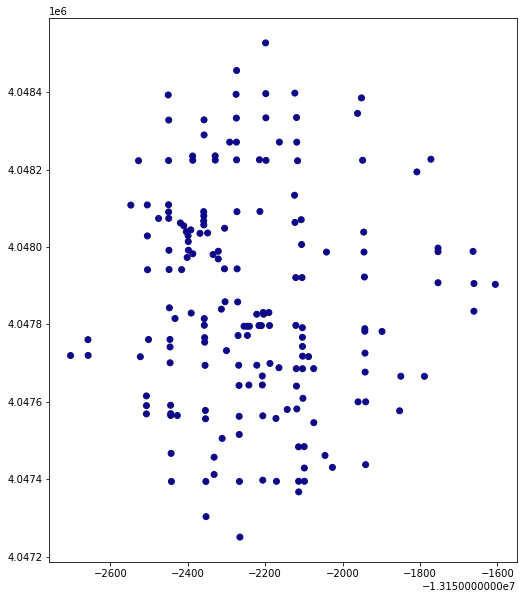

In [41]:
gdf_10.plot(figsize=(10,10),color=gdf_10.color)

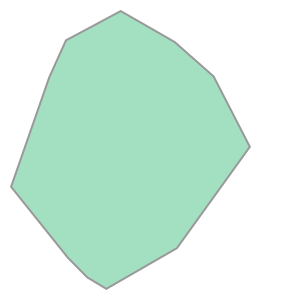

In [42]:
#creating our convex hull
gdf_10.unary_union.convex_hull

In [43]:
isochrones = gdf_nodes.dissolve("time")
isochrones

,geometry,y,x,highway,street_count,lon,lat,color
time,,,,,,,,
10 mins,"MULTIPOINT (-13152703.098 4047719.535, -131526...",4.048393e+06,-1.315245e+07,traffic_signals,4,-118.150475,34.145775,#0d0887


In [44]:
isochrones = isochrones.convex_hull.reset_index()
isochrones

,time,0
0,10 mins,"POLYGON ((-13152265.489 4047250.399, -13152352..."


In [45]:
isochrones.columns=['time','geometry']
isochrones

,time,geometry
0,10 mins,"POLYGON ((-13152265.489 4047250.399, -13152352..."


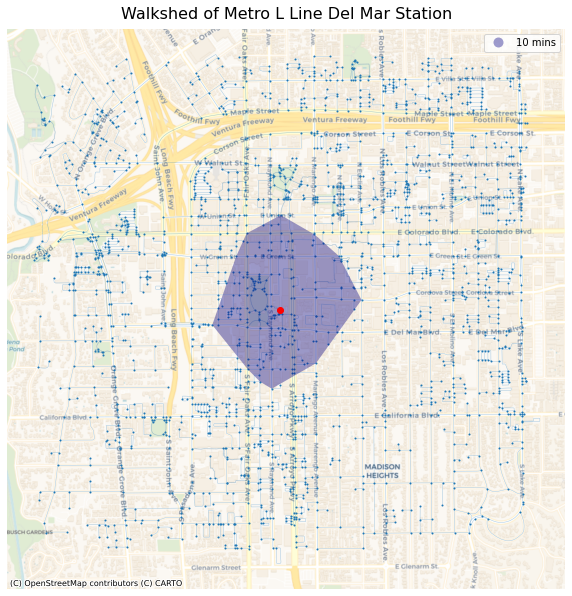

In [46]:
#plotting the convex hull on to the basemap

# set up the subplots
fig, ax = plt.subplots(figsize=(10,20))

# add the isochrones
isochrones.plot(alpha=0.4, 
                ax=ax, 
                column='time', 
                cmap='plasma', 
                legend=True,
                zorder=20)

# add the center node in red
gdf_nodes.loc[[center_node]].plot(ax=ax,color='r', zorder=30)

# add all nodes
gdf_nodes.plot(ax=ax, 
               markersize=1, 
               zorder=10)

# add the edges
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               alpha=0.2,
               zorder=10)

# hide the axis
ax.axis('off')

# give it a title
ax.set_title('Walkshed of Metro L Line Del Mar Station',fontsize=16,pad=10)

# add the basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

And there we have it! The convex hull of the 10 minute walkshed from Del Mar Station. Time to move on to the ACS data.

<AxesSubplot:>

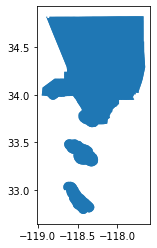

In [47]:
#Double checking our spatial data

df.plot()

In [48]:
# Quick peek at our data types, making sure our numbers a float types

df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2347 entries, 0 to 2346
Data columns (total 36 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   geoid                              2347 non-null   object  
 1   name                               2347 non-null   object  
 2   Total Foreign Born                 2347 non-null   float64 
 3   China, Hong Kong, Taiwan           2347 non-null   float64 
 4   China et al Entered 2010 or later  2347 non-null   float64 
 5   China et al Before 2010            2347 non-null   float64 
 6   Cuba                               2347 non-null   float64 
 7   Cuba Entered 2010 or later         2347 non-null   float64 
 8   Cuba Entered Before 2010           2347 non-null   float64 
 9   Dominican Republic                 2347 non-null   float64 
 10  D.R. Entered 2010 or later         2347 non-null   float64 
 11  D.R. Entered Before 2010           

In [49]:
# And another peek at our data set again before moving on to mapping

df.head()

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,...,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
0,05000US06037,"Los Angeles County, CA",3430507.0,288054.0,76162.0,211892.0,17332.0,1356.0,15976.0,12687.0,...,207873.0,98409.0,10841.0,87568.0,989775.0,173834.0,815941.0,"MULTIPOLYGON (((-118.70339 34.16859, -118.7033...",10081570.0,34.027508
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",1424.0,13.0,0.0,13.0,8.0,0.0,8.0,0.0,...,111.0,0.0,0.0,0.0,910.0,130.0,780.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",4283.0,33.247724
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",810.0,0.0,0.0,0.0,0.0,0.0,0.0,18.0,...,78.0,0.0,0.0,0.0,690.0,36.0,654.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",3405.0,23.788546
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",3167.0,0.0,0.0,0.0,0.0,0.0,0.0,53.0,...,76.0,0.0,0.0,0.0,2054.0,198.0,1856.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",6347.0,49.897589
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",1749.0,0.0,0.0,0.0,29.0,0.0,29.0,36.0,...,67.0,0.0,0.0,0.0,1120.0,147.0,973.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",3702.0,47.244733


### Starting to Build Our Foreign Born Percent by Census Tract Map Layer

Our data is nice and neat, so let's move on to creating our final maps with overlays.

<AxesSubplot:>

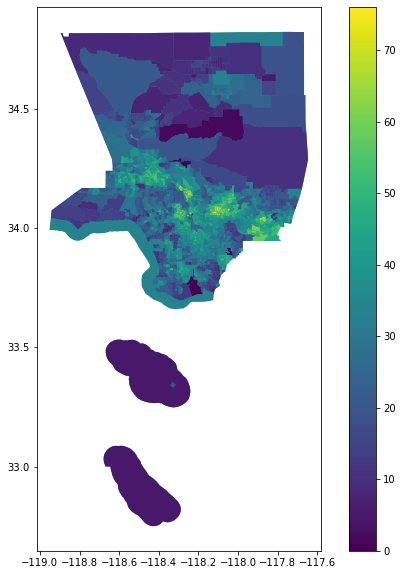

In [50]:
#Looking at our data as a choropleth for all of LA County

df.plot(figsize=(10,10),
        column='Percent Foreign Born',
        legend=True)

In [51]:
#Isolating our Del Mar Station walkshed census tracts

delmar = df[df["geoid"].isin(['14000US06037461902',  
                                '14000US06037463602', 
                                '14000US06037463700']
)
            ]

In [52]:
delmar.head()

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,...,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
1362,14000US06037461902,"Census Tract 4619.02, Los Angeles, CA",586.0,285.0,148.0,137.0,0.0,0.0,0.0,0.0,...,27.0,11.0,0.0,11.0,228.0,110.0,118.0,"MULTIPOLYGON (((-118.15570 34.14973, -118.1554...",1801.0,32.537479
1384,14000US06037463602,"Census Tract 4636.02, Los Angeles, CA",1926.0,509.0,144.0,365.0,6.0,0.0,6.0,0.0,...,38.0,0.0,0.0,0.0,989.0,604.0,385.0,"MULTIPOLYGON (((-118.15046 34.14577, -118.1497...",6057.0,31.797920
1385,14000US06037463700,"Census Tract 4637, Los Angeles, CA",602.0,191.0,68.0,123.0,0.0,0.0,0.0,0.0,...,32.0,0.0,0.0,0.0,308.0,58.0,250.0,"MULTIPOLYGON (((-118.16776 34.14147, -118.1676...",3138.0,19.184194


<AxesSubplot:>

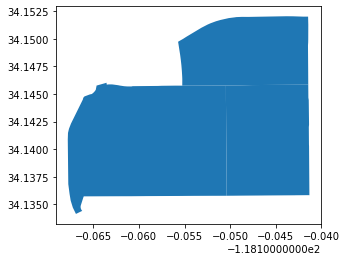

In [53]:
#Quick check to make sure it looks right

delmar.plot()

<AxesSubplot:>

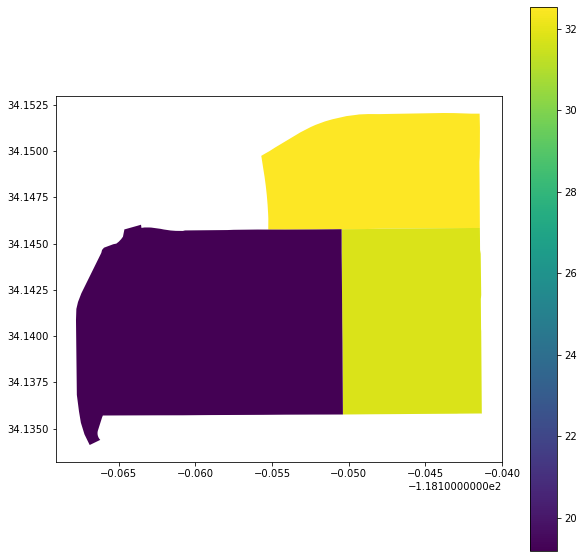

In [54]:
#Fairly narrow range of percentage foreign born here, with a noticeably higher percentage to the north

delmar.plot(figsize=(10,10),
        column='Percent Foreign Born',
        legend=True)

### Bringing it all together

First, let's project our map to web mercator

In [55]:
delmar_web_mercator = delmar.to_crs(epsg=3857)

Lets add a basemap and some details

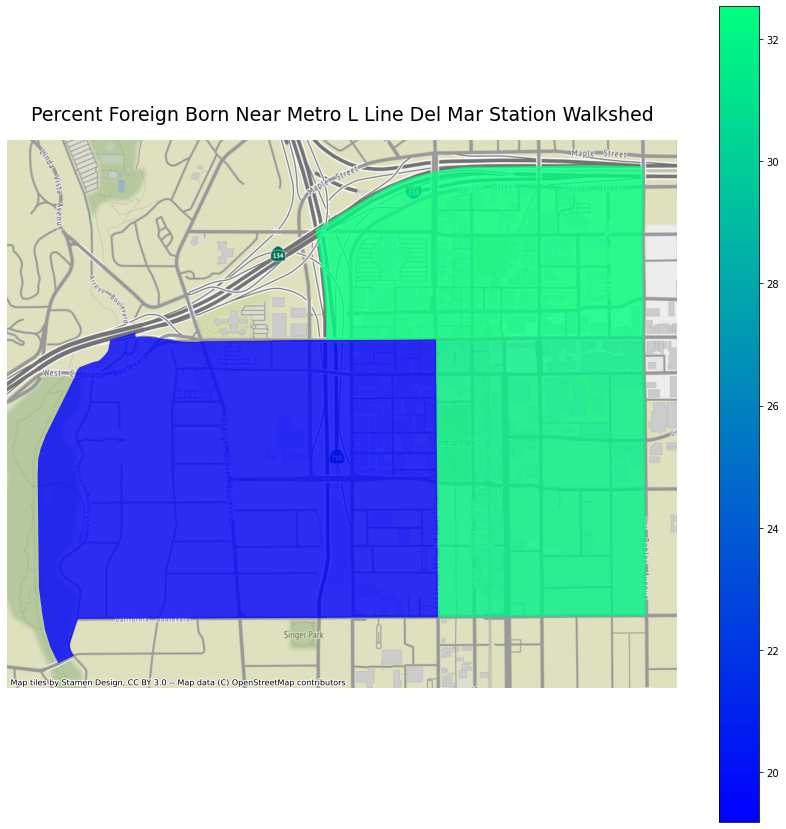

In [56]:
fig, ax = plt.subplots(figsize=(15, 15))
 
delmar_web_mercator.plot(
                    column='Percent Foreign Born',
                    ax=ax, legend=True,
                    alpha=0.8, 
                    cmap="winter")

ax.axis('off')

ax.set_title('Percent Foreign Born Near Metro L Line Del Mar Station Walkshed',fontsize=19, pad=20)

ctx.add_basemap(ax,source=ctx.providers.Stamen.Terrain)
#how can we add a legend and bins to this?

Looking good! Let's layer the isochrone layer on top to show us the walkshed from Del Mar Station

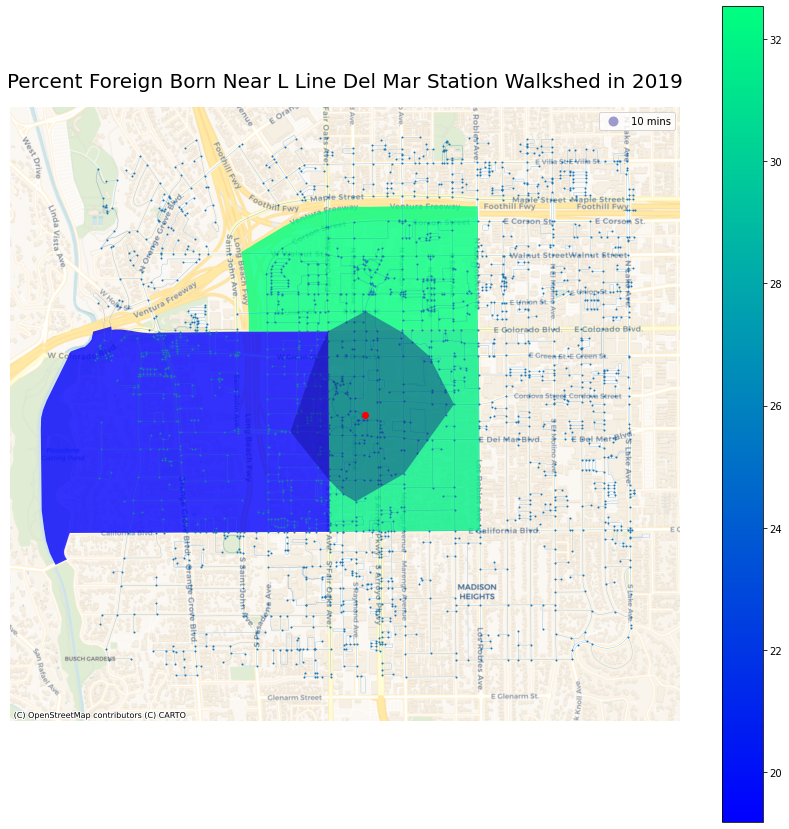

In [57]:
fig, ax = plt.subplots(figsize=(15, 15))
 
delmar_web_mercator.plot(
                    column='Percent Foreign Born',
                    ax=ax, legend=True,
                    alpha=0.8, 
                    cmap="winter")

# add the isochrones
isochrones.plot(alpha=0.4, 
                ax=ax, 
                column='time', 
                cmap='plasma', 
                legend=True,
                zorder=20)

# add the center node in red
gdf_nodes.loc[[center_node]].plot(ax=ax,color='r', zorder=30)

# add all nodes
gdf_nodes.plot(ax=ax, 
               markersize=1, 
               zorder=10)

# add the edges
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               alpha=0.2,
               zorder=10)

ax.axis('off')

ax.set_title('Percent Foreign Born Near L Line Del Mar Station Walkshed in 2019',fontsize=20, pad=20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

We see a higher proportion of foreign born population to the east of the station, and the station is in the largest census tract. There is more multi-family housing east of Arroyo Parkway, and is noticeably more dense than the western most census tract, which is along Orange Grove Blvd. This tract has more single family homes and considerably higher property values, along with an archery range, country club, and the Rose Bowl Parade headquarters.

### Percentage of Foreign Born Population in Metro L Line Chinatown Station Walkshed

Let's create a choropleth map of the Chinatown Station showing the percent Foreign Born population within the station walkshed. 

In [58]:
address = 'Chinatown Station, College Street, New Chinatown, Chinatown, Los Angeles, Los Angeles County, California, 90012, United States'
network_type = 'walk'
trip_times = [10] #in minutes
meters_per_minute = 80 # travel distance per minute

In [59]:
%%time
# %%time is a magic command to see how long it takes this cell to run 

# download the street network
G = ox.graph_from_address(address, network_type=network_type, dist = 1500)

CPU times: user 4.41 s, sys: 168 ms, total: 4.58 s
Wall time: 4.86 s


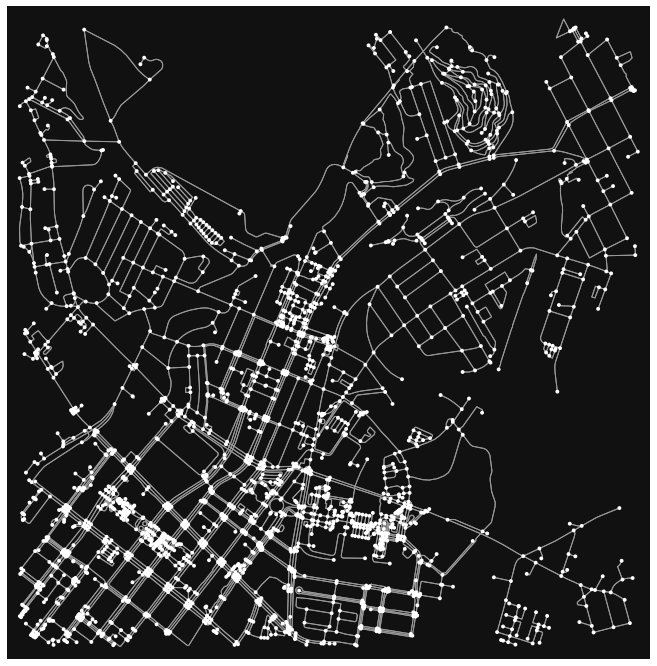

In [60]:
fig, ax = ox.plot_graph(G,figsize=(12,12))

In [61]:
G = ox.project_graph(G, to_crs='epsg:3857')

In [62]:
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

In [63]:
gdf_nodes.head()

,y,x,street_count,lon,lat,highway,geometry
osmid,,,,,,,
15027548,4.039027e+06,-1.316061e+07,3,-118.223785,34.076114,NaN,POINT (-13160611.557 4039026.875)
67619407,4.039118e+06,-1.316050e+07,4,-118.222746,34.076796,traffic_signals,POINT (-13160495.907 4039118.493)
123283621,4.038908e+06,-1.316055e+07,3,-118.223245,34.075226,NaN,POINT (-13160551.456 4038907.559)
15027549,4.038710e+06,-1.316045e+07,4,-118.222311,34.073758,traffic_signals,POINT (-13160447.416 4038710.296)
3723806094,4.038716e+06,-1.316045e+07,4,-118.222338,34.073802,NaN,POINT (-13160450.467 4038716.075)


### Plotting the station area

<AxesSubplot:>

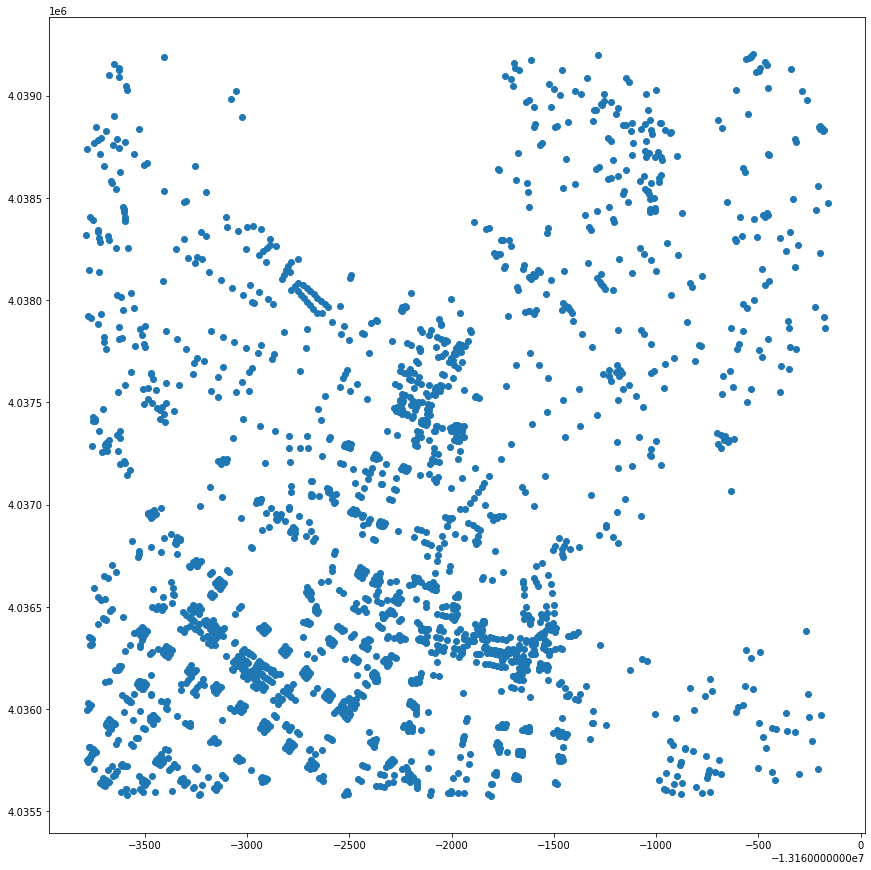

In [64]:
gdf_nodes.plot(figsize=(15,15))

In [65]:
gdf_edges.head()

osmid               name    highway  oneway  \
u        v          key                                                    
15027548 67619407   0      9126419    Humboldt Street   tertiary   False   
         123283621  0    358037415          Avenue 19   tertiary   False   
67619407 7871476832 0      9126419    Humboldt Street   tertiary   False   
         6787624912 0    398398790  San Fernando Road  secondary   False   
         15027548   0      9126419    Humboldt Street   tertiary   False   

                          length  \
u        v          key            
15027548 67619407   0    122.072   
         123283621  0    110.537   
67619407 7871476832 0     41.864   
         6787624912 0     67.319   
         15027548   0    122.072   

                                                                  geometry  \
u        v          key                                                      
15027548 67619407   0    LINESTRING (-13160611.557 4039026.875, -131605...   
         123283621  0    LINESTRING (-13160611.557 4039026.875, -131606...   
67619407 7871476832 0    LINESTRING (-13160495.907 4039118.493, -131604...   
         6787624912 0    LINESTRING (-13160495.907 4039118.493, -131605...   
         15027548   0    LINESTRING (-13160495.907 4039118.493, -131605...   

                        lanes maxspeed bridge service access tunnel width  
u        v          key                                                    
15027548 67619407   0     NaN      NaN    NaN     NaN    NaN    NaN   NaN  
         123283621  0       2      NaN    NaN     NaN    NaN    NaN   NaN  
67619407 7871476832 0     NaN      NaN    NaN     NaN    NaN    NaN   NaN  
         6787624912 0       4      NaN    NaN     NaN    NaN    NaN   NaN  
         15027548   0     NaN      NaN    NaN     NaN    NaN    NaN   NaN

<AxesSubplot:>

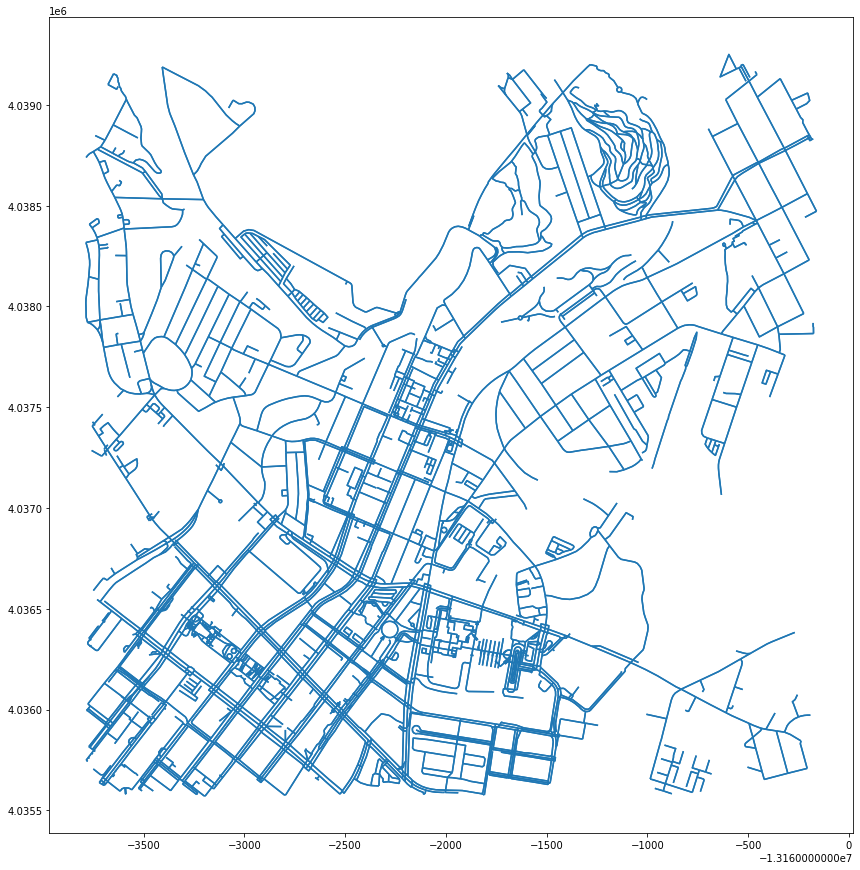

In [66]:
gdf_edges.plot(figsize=(15,15))

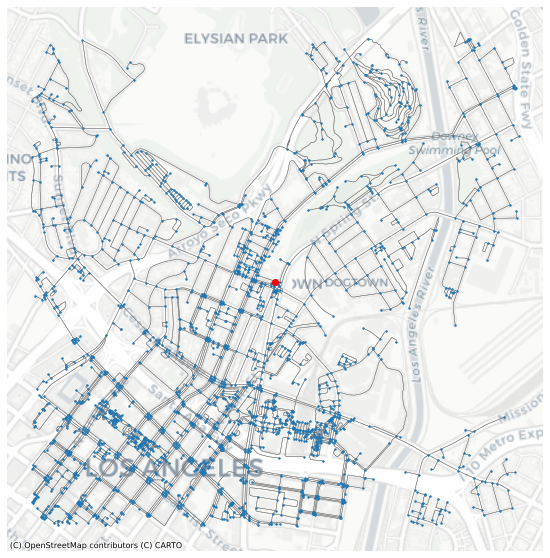

In [67]:
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(10,10))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gray', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax, 
               markersize=2, 
               zorder=20)

# add the center node in red also to ax
gdf_nodes.loc[[8290553634]].plot(ax=ax,
                                  color='r', 
                                  zorder=30)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,zoom=14)

In [68]:
gdf_edges.sample(5)

,,,osmid,name,highway,oneway,length,geometry,lanes,maxspeed,bridge,service,access,tunnel,width
u,v,key,,,,,,,,,,,,,
268653152,268653330,0,"[173008306, 24717514, 173008309]",Alpine Street,primary,False,111.875,"LINESTRING (-13163021.168 4037420.027, -131630...",4,NaN,yes,NaN,NaN,NaN,NaN
8873641173,3898644450,0,958988200,NaN,footway,False,3.489,"LINESTRING (-13163007.041 4036237.059, -131630...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
2158452542,6471392454,0,382210638,North Hill Street,secondary,False,35.915,"LINESTRING (-13163049.643 4036229.777, -131630...",5,NaN,NaN,NaN,NaN,NaN,NaN
2178255367,2178255368,0,207564507,NaN,footway,False,11.524,"LINESTRING (-13162622.900 4036066.030, -131626...",NaN,NaN,NaN,NaN,NaN,NaN,NaN
122980324,2155616212,0,47664064,Lilac Place,residential,False,8.203,"LINESTRING (-13163296.939 4038482.463, -131633...",2,NaN,NaN,NaN,NaN,NaN,NaN


In [69]:
gdf_edges['walk_time'] = (gdf_edges['length']/meters_per_minute)

In [70]:
gdf_edges.sample(5)

,,,osmid,name,highway,oneway,length,geometry,lanes,maxspeed,bridge,service,access,tunnel,width,walk_time
u,v,key,,,,,,,,,,,,,,
8400910262,6208583533,0,121832029,NaN,footway,False,48.355,"LINESTRING (-13161625.221 4036233.122, -131616...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.604437
7098324796,7098324798,0,759855975,NaN,service,False,137.904,"LINESTRING (-13162998.570 4038359.645, -131630...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.723800
68214580,6471427828,0,405180175,West Temple Street,secondary,False,12.726,"LINESTRING (-13162710.575 4036174.755, -131627...",4,NaN,NaN,NaN,NaN,NaN,NaN,0.159075
4466862366,8873833274,0,319308278,NaN,footway,False,79.837,"LINESTRING (-13163510.639 4036352.102, -131635...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.997963
2178255359,2178255356,0,207564508,NaN,footway,False,14.146,"LINESTRING (-13162520.508 4036006.562, -131625...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.176825


In [71]:
# assign a color hex code for each trip time isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), 
                                cmap='plasma', 
                                start=0, 
                                return_hex=True)
print(trip_times)
print(iso_colors)

[10]
['#0d0887']


In [72]:
time_color = list(zip(trip_times, iso_colors))
time_color

[(10, '#0d0887')]

In [73]:
for time, color in list(time_color):

    # for each trip time, create an egograph of nodes that fall within that distance
    subgraph = nx.ego_graph(G, 8290553634, radius=time)

    print('There are ' + str(len(subgraph.nodes())) + ' nodes within ' + str(time) + ' minutes ')
    
    # for each of those nodes, update the gdf_nodes dataframe and assign it with its associated distance color
    for node in subgraph.nodes():
        gdf_nodes.loc[node,'time'] = str(time) + ' mins'
        gdf_nodes.loc[node,'color'] = color

There are 173 nodes within 10 minutes 


In [74]:
gdf_nodes.sample(30)

,y,x,street_count,lon,lat,highway,geometry,time,color
osmid,,,,,,,,,
8881631475,4.036580e+06,-1.316208e+07,3,-118.236987,34.057908,NaN,POINT (-13162081.230 4036580.255),NaN,NaN
5322526879,4.037591e+06,-1.316215e+07,1,-118.237620,34.065430,NaN,POINT (-13162151.696 4037590.997),NaN,NaN
5731678875,4.036193e+06,-1.316157e+07,4,-118.232413,34.055026,NaN,POINT (-13161571.999 4036193.069),NaN,NaN
8881865770,4.036199e+06,-1.316166e+07,3,-118.233239,34.055072,NaN,POINT (-13161664.016 4036199.196),NaN,NaN
683075091,4.037696e+06,-1.316195e+07,1,-118.235811,34.066209,NaN,POINT (-13161950.241 4037695.799),10 mins,#0d0887
7863815762,4.037445e+06,-1.316222e+07,4,-118.238199,34.064342,NaN,POINT (-13162216.060 4037444.887),10 mins,#0d0887
6471392432,4.036175e+06,-1.316297e+07,3,-118.244943,34.054891,NaN,POINT (-13162966.833 4036174.930),NaN,NaN
8873888181,4.036957e+06,-1.316249e+07,3,-118.240617,34.060714,NaN,POINT (-13162485.220 4036957.322),NaN,NaN
6732245810,4.037203e+06,-1.316255e+07,3,-118.241161,34.062541,NaN,POINT (-13162545.856 4037202.836),NaN,NaN


In [75]:
gdf_nodes['color'].fillna('#cccccc', inplace=True)

In [76]:
gdf_nodes.sample(5)

,y,x,street_count,lon,lat,highway,geometry,time,color
osmid,,,,,,,,,
8409457170,4.037501e+06,-1.316217e+07,1,-118.237745,34.064762,NaN,POINT (-13162165.510 4037501.245),10 mins,#0d0887
2094664021,4.038578e+06,-1.316099e+07,3,-118.227145,34.072776,NaN,POINT (-13160985.568 4038578.269),NaN,#cccccc
3144612047,4.037682e+06,-1.316199e+07,3,-118.236163,34.066110,NaN,POINT (-13161989.459 4037682.429),10 mins,#0d0887
1966270962,4.038662e+06,-1.316351e+07,3,-118.249781,34.073397,NaN,POINT (-13163505.374 4038661.686),NaN,#cccccc
9416089365,4.035815e+06,-1.316238e+07,3,-118.239651,34.052210,NaN,POINT (-13162377.719 4035814.656),NaN,#cccccc


<AxesSubplot:>

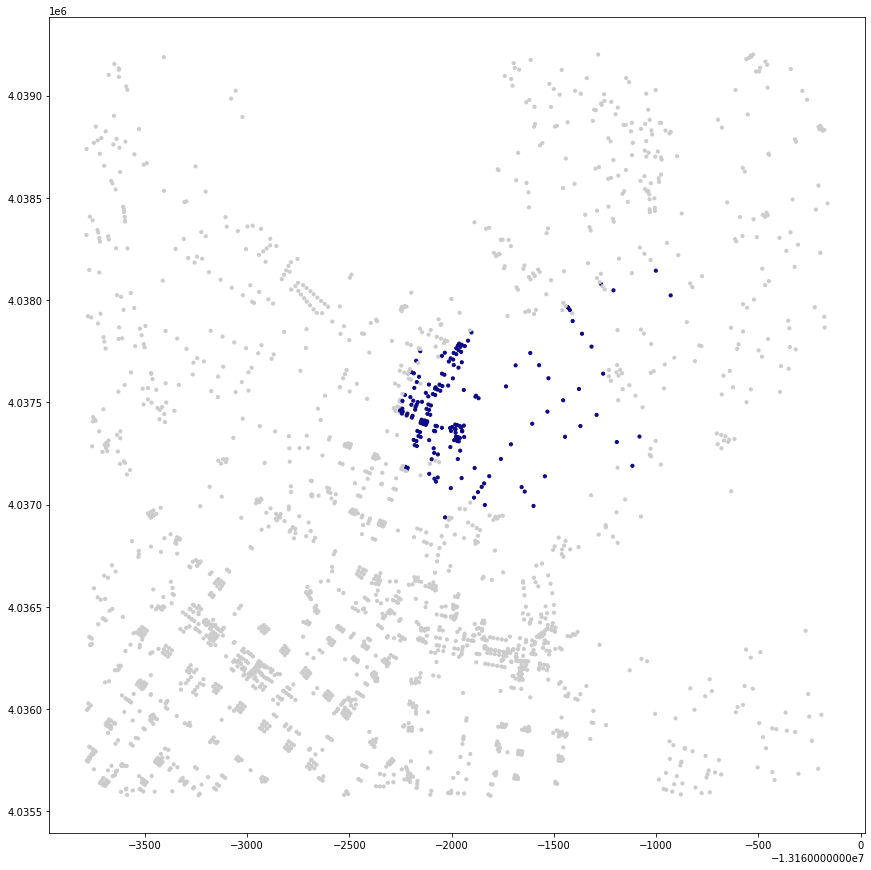

In [77]:
gdf_nodes.plot(figsize=(15,15),
               color=gdf_nodes['color'],
               markersize=10)

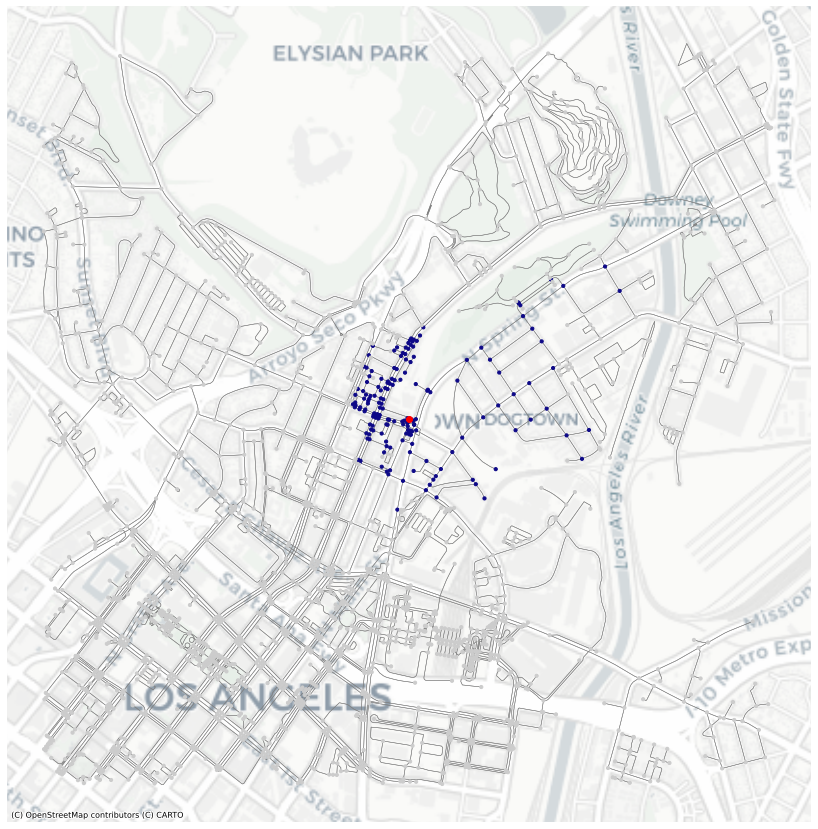

In [78]:
# a "full" map
# set up the subplot (single plot = ax)
fig, ax = plt.subplots(figsize=(15,15))

# add the edges to ax
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               edgecolor='gray', 
               zorder=10)

# add all nodes to ax
gdf_nodes.plot(ax=ax,
               color=gdf_nodes['color'],
               markersize=10, 
               zorder=20)

# marking the station site with a red dot. Grabbed the station's node from OpenStreet Maps
gdf_nodes.loc[[8290553634]].plot(ax=ax,
                                  color='r', 
                                  zorder=30)

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,zoom=14)

In [79]:
gdf_nodes[gdf_nodes['time']=='10 mins']

,y,x,street_count,lon,lat,highway,geometry,time,color
osmid,,,,,,,,,
15717265,4.038144e+06,-1.316100e+07,4,-118.227285,34.069542,traffic_signals,POINT (-13161001.164 4038143.644),10 mins,#0d0887
122656713,4.038023e+06,-1.316093e+07,4,-118.226635,34.068642,NaN,POINT (-13160928.751 4038022.752),10 mins,#0d0887
123037729,4.038048e+06,-1.316121e+07,4,-118.229147,34.068827,NaN,POINT (-13161208.430 4038047.599),10 mins,#0d0887
17677673,4.037351e+06,-1.316198e+07,3,-118.236082,34.063645,NaN,POINT (-13161980.397 4037351.213),10 mins,#0d0887
67619377,4.037281e+06,-1.316201e+07,3,-118.236313,34.063122,NaN,POINT (-13162006.145 4037280.975),10 mins,#0d0887
...,...,...,...,...,...,...,...,...,...
8409454505,4.037529e+06,-1.316211e+07,1,-118.237282,34.064967,NaN,POINT (-13162114.070 4037528.873),10 mins,#0d0887
8409457169,4.037488e+06,-1.316217e+07,3,-118.237797,34.064661,NaN,POINT (-13162171.299 4037487.673),10 mins,#0d0887
8409457171,4.037477e+06,-1.316218e+07,1,-118.237841,34.064580,NaN,POINT (-13162176.286 4037476.802),10 mins,#0d0887


In [80]:
gdf_10 = gdf_nodes[gdf_nodes['time']=='10 mins']

<AxesSubplot:>

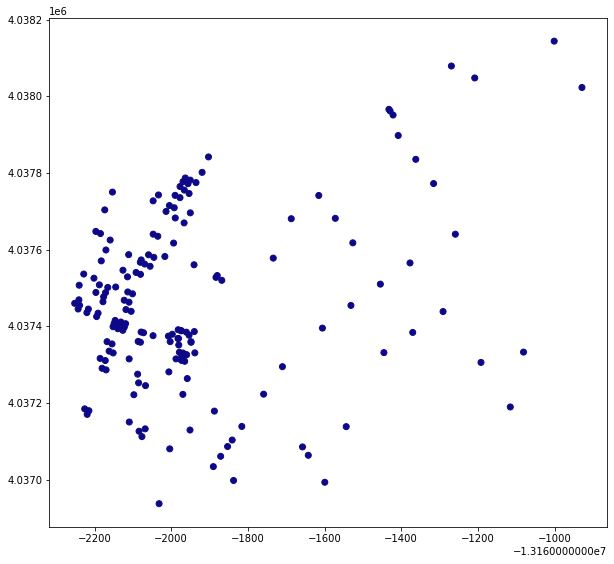

In [81]:
gdf_10.plot(figsize=(10,10),color=gdf_10.color)

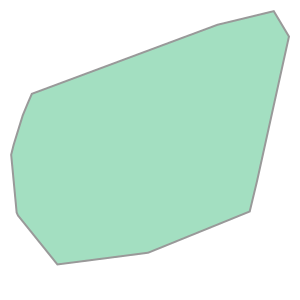

In [82]:
gdf_10.unary_union.convex_hull

In [83]:
# Getting a oblong asymmetrical shape here. Code seems right so there's something up here... Maybe it has to do with osmnx? Or maybe it's just the topology of the station area?

isochrones = gdf_nodes.dissolve("time")
isochrones

,geometry,y,x,street_count,lon,lat,highway,color
time,,,,,,,,
10 mins,"MULTIPOINT (-13162251.772 4037459.803, -131622...",4.038144e+06,-1.316100e+07,4,-118.227285,34.069542,traffic_signals,#0d0887


In [84]:
isochrones = isochrones.convex_hull.reset_index()
isochrones

,time,0
0,10 mins,"POLYGON ((-13162031.671 4036937.288, -13162219..."


In [85]:
isochrones.columns=['time','geometry']
isochrones

,time,geometry
0,10 mins,"POLYGON ((-13162031.671 4036937.288, -13162219..."


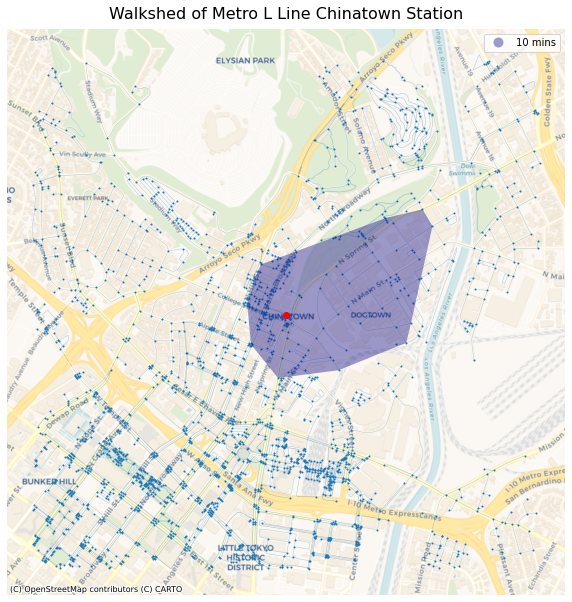

In [86]:
# set up the subplots
fig, ax = plt.subplots(figsize=(10,20))

# add the isochrones
isochrones.plot(alpha=0.4, 
                ax=ax, 
                column='time', 
                cmap='plasma', 
                legend=True,
                zorder=20)

# add the center node in red
gdf_nodes.loc[[8290553634]].plot(ax=ax,color='r', zorder=30)

# add all nodes
gdf_nodes.plot(ax=ax, 
               markersize=1, 
               zorder=10)

# add the edges
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               alpha=0.2,
               zorder=10)

# hide the axis
ax.axis('off')

# give it a title
ax.set_title('Walkshed of Metro L Line Chinatown Station',fontsize=16,pad=10)

# add the basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

### Choropleth map of percent foreign born in the Chinatown Station walkshed

Now we pivot to create the choropleth map of the percent foreign born in the census tracts in our station walkshed.

### Starting to build out our map

Let's do a big snaphot of LA County by making a choropleth map of percent foreign born relative to each census tract. 

<AxesSubplot:>

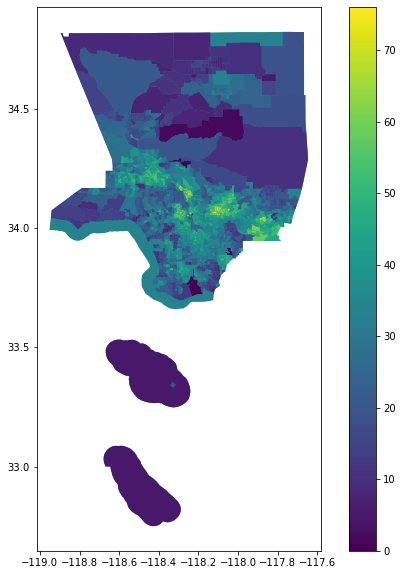

In [87]:
df.plot(figsize=(10,10),
        column='Percent Foreign Born',
        legend=True)

### Isolating Our Chinatown Walkshed

Based on the walk shed map we created, we use its nodes to cross reference a census tract map and identify the tracts in our walkshed. We now isolate those tracts into its own variable.

In [88]:
ChinatownStation = df[df["geoid"].isin(['14000US06037206010', 
                                       '14000US06037207103', 
                                       '14000US06037207102',
                                       '14000US06037206020']
                                      )
                     ]

In [89]:
ChinatownStation.head()

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,...,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
531,14000US06037206010,"Census Tract 2060.10, Los Angeles, CA",2059.0,827.0,172.0,655.0,0.0,0.0,0.0,0.0,...,12.0,187.0,28.0,159.0,122.0,25.0,97.0,"MULTIPOLYGON (((-118.23924 34.06726, -118.2380...",4121.0,49.963601
532,14000US06037206020,"Census Tract 2060.20, Los Angeles, CA",1074.0,39.0,24.0,15.0,0.0,0.0,0.0,8.0,...,18.0,4.0,0.0,4.0,364.0,48.0,316.0,"MULTIPOLYGON (((-118.23787 34.05427, -118.2378...",8947.0,12.004024
539,14000US06037207102,"Census Tract 2071.02, Los Angeles, CA",1837.0,1090.0,56.0,1034.0,0.0,0.0,0.0,0.0,...,20.0,15.0,0.0,15.0,408.0,49.0,359.0,"MULTIPOLYGON (((-118.24303 34.05735, -118.2429...",2926.0,62.781955
540,14000US06037207103,"Census Tract 2071.03, Los Angeles, CA",1649.0,1164.0,332.0,832.0,6.0,0.0,6.0,0.0,...,50.0,199.0,9.0,190.0,195.0,59.0,136.0,"MULTIPOLYGON (((-118.24557 34.06470, -118.2454...",2393.0,68.909319


<AxesSubplot:>

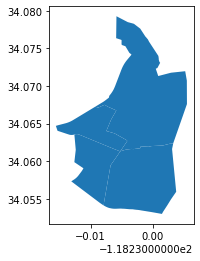

In [90]:
ChinatownStation.plot()

There's our census tracts. Let's add some statistics to these census tracts. 

<AxesSubplot:>

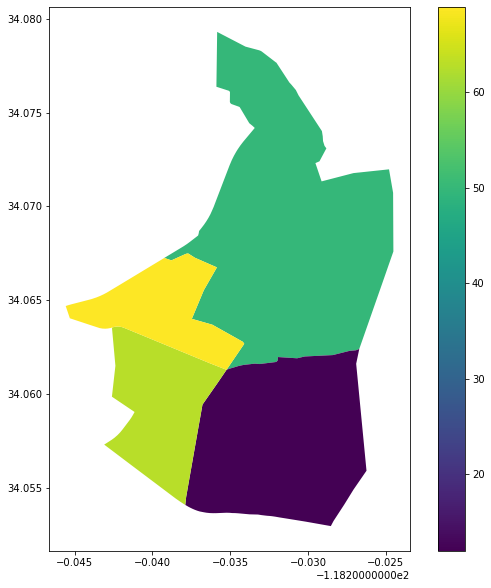

In [91]:
ChinatownStation.plot(figsize=(10,10),
        column='Percent Foreign Born',
        legend=True)

Wow, there's a census tract north of our station that has more than a 60% foreign born population. Let's add some map detail like titles and a basemap. 

### Adding a base map and map details

We first have to project our data to web mercator.

In [92]:
ChinatownStation_web_mercator = ChinatownStation.to_crs(epsg=3857)

Now we can tap into adding map details and our basemap.

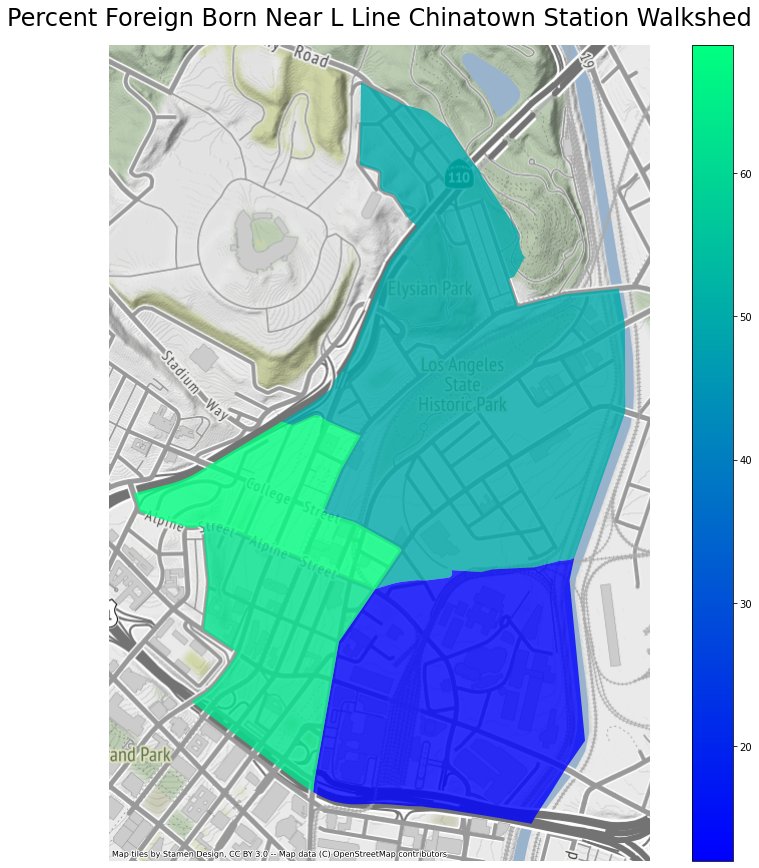

In [93]:
fig, ax = plt.subplots(figsize=(15, 15))
 
ChinatownStation_web_mercator.plot(
                    column='Percent Foreign Born',
                    ax=ax, legend=True,
                    alpha=0.8, 
                    cmap="winter")

ax.axis('off')

ax.set_title('Percent Foreign Born Near L Line Chinatown Station Walkshed',fontsize=24, pad=20)

ctx.add_basemap(ax,source=ctx.providers.Stamen.Terrain)

Nice! Let's layer our isochrone map with our choropleth map.

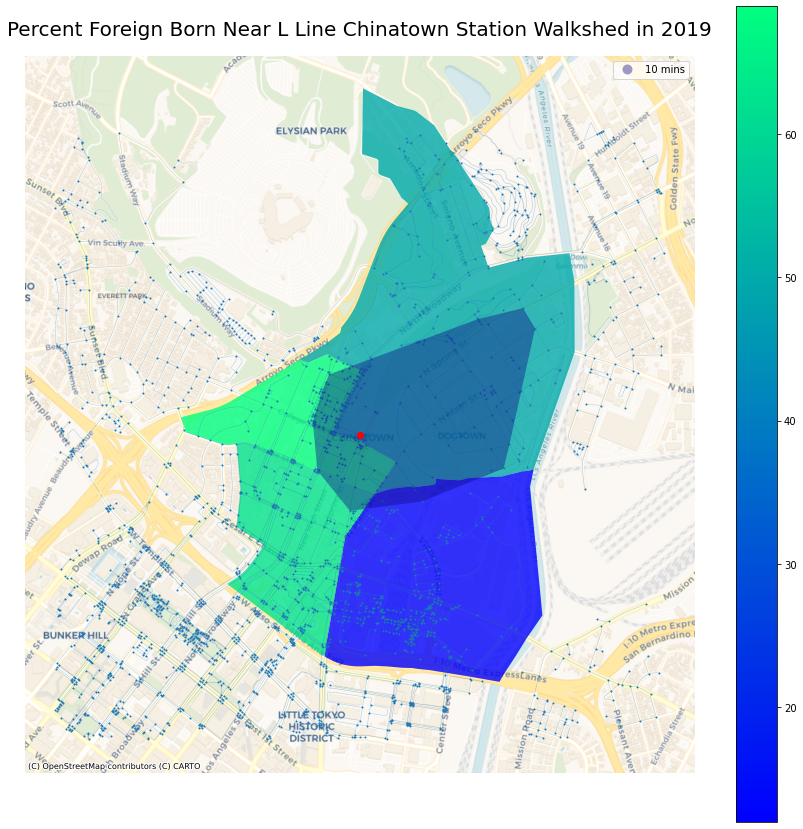

In [94]:
fig, ax = plt.subplots(figsize=(15, 15))
 
ChinatownStation_web_mercator.plot(
                    column='Percent Foreign Born',
                    ax=ax, legend=True,
                    alpha=0.8, 
                    cmap="winter")

# add the isochrones
isochrones.plot(alpha=0.4, 
                ax=ax, 
                column='time', 
                cmap='plasma', 
                legend=True,
                zorder=20)

# add the center node in red
gdf_nodes.loc[[8290553634]].plot(ax=ax,color='r', zorder=30)

# add all nodes
gdf_nodes.plot(ax=ax, 
               markersize=1, 
               zorder=10)

# add the edges
gdf_edges.plot(ax=ax,
               linewidth=0.5,
               alpha=0.2,
               zorder=10)

ax.axis('off')

ax.set_title('Percent Foreign Born Near L Line Chinatown Station Walkshed in 2019',fontsize=20, pad=20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Voyager)

Great! As we can see there's a high percentage of foreign born residents north of the station. South of the station there's approximately only 20% foreign born. That's less than the 34% county average (to see the county average for foreign born, run the cell below and scroll to the last column).

This dark blue census tract is also unique in that it is the highest populated tract in our walkshed but is very industrial. The tract likely gets its density from the Twin Towers Correctional Facility. There is little affordable housing in this census tract. The two main housing options are 272-unit luxury apartments on Cesar Chavez and Alameda, and market rate housing next to Union Station. These options likely do not meet the needs of foreign born residents who tend to skew lower income.  

## Plotly Bar Charts to Explore Our Data in a Different Way

So this was a major hurdle for us as we were unable to directly utilize are data as-is for a plotly bar chart. We're almost certain that there's a super easy way to do this, but we ended up using a much more tedious "brute force" type way instead.
<br>
<br>
We used plotly to create bar graphs to show trends in foreign born populations in each station walkshed, and also the broader neighborhood/city. We trimmed and manipulated our data to show each ethnicity's population as a percentage relative to the total number of foreign born residents in the station area and/or neighborhood. We then re-organized the data into a Pandas DataFrame so that we had a column of all of the ethnicities, and a column each for the years of entry.

In [95]:
# Trimming for Chinatown station and creating a variable that doesn't conflict with the variables used above for the maps

ctown_df = df[df["geoid"].isin(['14000US06037206010', 
                                       '14000US06037207103', 
                                       '14000US06037207102',
                                       '14000US06037206020']
                                      )
                     ]

In [96]:
ctown_df

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,...,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
531,14000US06037206010,"Census Tract 2060.10, Los Angeles, CA",2059.0,827.0,172.0,655.0,0.0,0.0,0.0,0.0,...,12.0,187.0,28.0,159.0,122.0,25.0,97.0,"MULTIPOLYGON (((-118.23924 34.06726, -118.2380...",4121.0,49.963601
532,14000US06037206020,"Census Tract 2060.20, Los Angeles, CA",1074.0,39.0,24.0,15.0,0.0,0.0,0.0,8.0,...,18.0,4.0,0.0,4.0,364.0,48.0,316.0,"MULTIPOLYGON (((-118.23787 34.05427, -118.2378...",8947.0,12.004024
539,14000US06037207102,"Census Tract 2071.02, Los Angeles, CA",1837.0,1090.0,56.0,1034.0,0.0,0.0,0.0,0.0,...,20.0,15.0,0.0,15.0,408.0,49.0,359.0,"MULTIPOLYGON (((-118.24303 34.05735, -118.2429...",2926.0,62.781955
540,14000US06037207103,"Census Tract 2071.03, Los Angeles, CA",1649.0,1164.0,332.0,832.0,6.0,0.0,6.0,0.0,...,50.0,199.0,9.0,190.0,195.0,59.0,136.0,"MULTIPOLYGON (((-118.24557 34.06470, -118.2454...",2393.0,68.909319


In [97]:
# Creating a totals row because we're not concerned with dividing our charts by census tracts

ctown_df = ctown_df.append(ctown_df.sum(numeric_only=True), ignore_index=True)

In [98]:
ctown_df

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,...,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
0,14000US06037206010,"Census Tract 2060.10, Los Angeles, CA",2059.0,827.0,172.0,655.0,0.0,0.0,0.0,0.0,...,12.0,187.0,28.0,159.0,122.0,25.0,97.0,"MULTIPOLYGON (((-118.23924 34.06726, -118.2380...",4121.0,49.963601
1,14000US06037206020,"Census Tract 2060.20, Los Angeles, CA",1074.0,39.0,24.0,15.0,0.0,0.0,0.0,8.0,...,18.0,4.0,0.0,4.0,364.0,48.0,316.0,"MULTIPOLYGON (((-118.23787 34.05427, -118.2378...",8947.0,12.004024
2,14000US06037207102,"Census Tract 2071.02, Los Angeles, CA",1837.0,1090.0,56.0,1034.0,0.0,0.0,0.0,0.0,...,20.0,15.0,0.0,15.0,408.0,49.0,359.0,"MULTIPOLYGON (((-118.24303 34.05735, -118.2429...",2926.0,62.781955
3,14000US06037207103,"Census Tract 2071.03, Los Angeles, CA",1649.0,1164.0,332.0,832.0,6.0,0.0,6.0,0.0,...,50.0,199.0,9.0,190.0,195.0,59.0,136.0,"MULTIPOLYGON (((-118.24557 34.06470, -118.2454...",2393.0,68.909319
4,NaN,NaN,6619.0,3120.0,584.0,2536.0,6.0,0.0,6.0,8.0,...,100.0,405.0,37.0,368.0,1089.0,181.0,908.0,None,18387.0,193.658898


In [99]:
# Because we're not concerned with dividng by census tracts anymore, I'm going to go ahead and create another variable just to manipulate our totals.

ctown_df_mini = ctown_df

In [100]:
ctown_df_mini = ctown_df.drop(index=[0,1,2,3])

In [101]:
ctown_df_mini

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,...,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
4,NaN,NaN,6619.0,3120.0,584.0,2536.0,6.0,0.0,6.0,8.0,...,100.0,405.0,37.0,368.0,1089.0,181.0,908.0,None,18387.0,193.658898


In [102]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [103]:
ctown_df_mini

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,D.R. Entered 2010 or later,D.R. Entered Before 2010,El Salvador,E.S. Entered 2010 or later,E.S. Entered Before 2010,Guatemala,Guatemala Entered 2010 or later,Guatemala Entered Before 2010,India,India Entered 2010 or later,India Entered Before 2010,Mexico,Mexico Entered 2010 or later,Mexico Entered Before 2010,Philippines,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
4,NaN,NaN,6619.0,3120.0,584.0,2536.0,6.0,0.0,6.0,8.0,0.0,8.0,314.0,7.0,307.0,156.0,16.0,140.0,8.0,0.0,8.0,1389.0,27.0,1362.0,124.0,24.0,100.0,405.0,37.0,368.0,1089.0,181.0,908.0,None,18387.0,193.658898


#### Because we're trying to compare our station area charts with our broader neighborhood charts, we wanted to normalize our data so we're not comparing small populations to giant populations. As a result, we had to create new columns to show percent of foreign born populations relative to the total foreign born population for that given area (station walkshed or neighborhood/city).

In [104]:
# Creating percentage columns

ctown_df_mini['Percent From China, Hong Kong, Taiwan'] = ctown_df_mini['China, Hong Kong, Taiwan']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From China et al Entered 2010 or later'] = ctown_df_mini['China et al Entered 2010 or later']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From China et al Before 2010'] = ctown_df_mini['China et al Before 2010']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Cuba'] = ctown_df_mini['Cuba']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Cuba Entered 2010 or later'] = ctown_df_mini['Cuba Entered 2010 or later']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Cuba Entered Before 2010'] = ctown_df_mini['Cuba Entered Before 2010']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Dominican Republic'] = ctown_df_mini['Dominican Republic']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From D.R. Entered 2010 or later'] = ctown_df_mini['D.R. Entered 2010 or later']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From D.R. Entered Before 2010'] = ctown_df_mini['D.R. Entered Before 2010']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From El Salvador'] = ctown_df_mini['El Salvador']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From E.S. Entered 2010 or later'] = ctown_df_mini['E.S. Entered 2010 or later']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From E.S. Entered Before 2010'] = ctown_df_mini['E.S. Entered Before 2010']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Guatemala'] = ctown_df_mini['Guatemala']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Guatemala Entered 2010 or later'] = ctown_df_mini['Guatemala Entered 2010 or later']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Guatemala Entered Before 2010'] = ctown_df_mini['Guatemala Entered Before 2010']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From India'] = ctown_df_mini['India']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From India Entered 2010 or later'] = ctown_df_mini['India Entered 2010 or later']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From India Entered Before 2010'] = ctown_df_mini['India Entered Before 2010']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Mexico'] = ctown_df_mini['Mexico']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Mexico Entered 2010 or later'] = ctown_df_mini['Mexico Entered 2010 or later']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Mexico Entered Before 2010'] = ctown_df_mini['Mexico Entered Before 2010']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Philippines'] = ctown_df_mini['Mexico']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Philippines Entered 2010 or later'] = ctown_df_mini['Philippines Entered 2010 or later']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Philippines Entered Before 2010'] = ctown_df_mini['Philippines Entered Before 2010']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Vietnam'] = ctown_df_mini['Vietnam']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Vietnam Entered 2010 or later'] = ctown_df_mini['Vietnam Entered 2010 or later']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From Vietnam Entered Before 2010'] = ctown_df_mini['Vietnam Entered Before 2010']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From All Other Countries'] = ctown_df_mini['All Other Countries']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From A.O.C. Entered 2010 or later'] = ctown_df_mini['A.O.C. Entered 2010 or later']/ctown_df_mini['Total Foreign Born']*100
ctown_df_mini['Percent From A.O.C. Entered Before 2010'] = ctown_df_mini['A.O.C. Entered Before 2010']/ctown_df_mini['Total Foreign Born']*100

In [105]:
# Making sure our columns made it in

ctown_df_mini

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,D.R. Entered 2010 or later,D.R. Entered Before 2010,El Salvador,E.S. Entered 2010 or later,E.S. Entered Before 2010,Guatemala,Guatemala Entered 2010 or later,Guatemala Entered Before 2010,India,India Entered 2010 or later,India Entered Before 2010,Mexico,Mexico Entered 2010 or later,Mexico Entered Before 2010,Philippines,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born,"Percent From China, Hong Kong, Taiwan",Percent From China et al Entered 2010 or later,Percent From China et al Before 2010,Percent From Cuba,Percent From Cuba Entered 2010 or later,Percent From Cuba Entered Before 2010,Percent From Dominican Republic,Percent From D.R. Entered 2010 or later,Percent From D.R. Entered Before 2010,Percent From El Salvador,Percent From E.S. Entered 2010 or later,Percent From E.S. Entered Before 2010,Percent From Guatemala,Percent From Guatemala Entered 2010 or later,Percent From Guatemala Entered Before 2010,Percent From India,Percent From India Entered 2010 or later,Percent From India Entered Before 2010,Percent From Mexico,Percent From Mexico Entered 2010 or later,Percent From Mexico Entered Before 2010,Percent From Philippines,Percent From Philippines Entered 2010 or later,Percent From Philippines Entered Before 2010,Percent From Vietnam,Percent From Vietnam Entered 2010 or later,Percent From Vietnam Entered Before 2010,Percent From All Other Countries,Percent From A.O.C. Entered 2010 or later,Percent From A.O.C. Entered Before 2010
4,NaN,NaN,6619.0,3120.0,584.0,2536.0,6.0,0.0,6.0,8.0,0.0,8.0,314.0,7.0,307.0,156.0,16.0,140.0,8.0,0.0,8.0,1389.0,27.0,1362.0,124.0,24.0,100.0,405.0,37.0,368.0,1089.0,181.0,908.0,None,18387.0,193.658898,47.13703,8.823085,38.313945,0.090648,0.0,0.090648,0.120864,0.0,0.120864,4.743919,0.105756,4.638163,2.356851,0.241728,2.115123,0.120864,0.0,0.120864,20.985043,0.407917,20.577126,20.985043,0.362593,1.510802,6.118749,0.558997,5.559752,16.452636,2.734552,13.718084


In [106]:
# And now dropping our raw number columns to simplify data for data frame conversion and ulimately plotly graphing

ctown_df_mini.drop(columns=['geoid',
 'name',
 'Total Foreign Born',
 'China, Hong Kong, Taiwan',
 'China et al Entered 2010 or later',
 'China et al Before 2010',
 'Cuba',
 'Cuba Entered 2010 or later',
 'Cuba Entered Before 2010',
 'Dominican Republic',
 'D.R. Entered 2010 or later',
 'D.R. Entered Before 2010',
 'El Salvador',
 'E.S. Entered 2010 or later',
 'E.S. Entered Before 2010',        
 'Guatemala',
 'Guatemala Entered 2010 or later',
 'Guatemala Entered Before 2010',   
 'India',
 'India Entered 2010 or later',
 'India Entered Before 2010', 
 'Mexico',
 'Mexico Entered 2010 or later',
 'Mexico Entered Before 2010', 
 'Philippines',
 'Philippines Entered 2010 or later',
 'Philippines Entered Before 2010', 
 'Vietnam',
 'Vietnam Entered 2010 or later',
 'Vietnam Entered Before 2010', 
 'All Other Countries',
 'A.O.C. Entered 2010 or later',
 'A.O.C. Entered Before 2010', 
 'geometry',
 'Total Population',
 'Percent Foreign Born']
                   )

,"Percent From China, Hong Kong, Taiwan",Percent From China et al Entered 2010 or later,Percent From China et al Before 2010,Percent From Cuba,Percent From Cuba Entered 2010 or later,Percent From Cuba Entered Before 2010,Percent From Dominican Republic,Percent From D.R. Entered 2010 or later,Percent From D.R. Entered Before 2010,Percent From El Salvador,Percent From E.S. Entered 2010 or later,Percent From E.S. Entered Before 2010,Percent From Guatemala,Percent From Guatemala Entered 2010 or later,Percent From Guatemala Entered Before 2010,Percent From India,Percent From India Entered 2010 or later,Percent From India Entered Before 2010,Percent From Mexico,Percent From Mexico Entered 2010 or later,Percent From Mexico Entered Before 2010,Percent From Philippines,Percent From Philippines Entered 2010 or later,Percent From Philippines Entered Before 2010,Percent From Vietnam,Percent From Vietnam Entered 2010 or later,Percent From Vietnam Entered Before 2010,Percent From All Other Countries,Percent From A.O.C. Entered 2010 or later,Percent From A.O.C. Entered Before 2010
4,47.13703,8.823085,38.313945,0.090648,0.0,0.090648,0.120864,0.0,0.120864,4.743919,0.105756,4.638163,2.356851,0.241728,2.115123,0.120864,0.0,0.120864,20.985043,0.407917,20.577126,20.985043,0.362593,1.510802,6.118749,0.558997,5.559752,16.452636,2.734552,13.718084


In [107]:
# Creating our panadas df

ctown_df_mini = pd.DataFrame([['China, Hong Kong, Taiwan', 47.13703, 8.823085, 38.313945], 
                         ['Cuba', 0.090648, 0.0, 0.090648], 
                         ['Dominican Republic', 0.120864, 0.0, 0.120864], 
                         ['El Salvador', 4.743919, 0.105756, 4.638163],
                         ['Guatemala', 2.356851, 0.241728, 2.115123],
                         ['India', 0.120864, 0.0, 0.120864],
                         ['Mexico', 20.985043, 0.407917, 20.577126],
                         ['Philippines', 20.985043, 0.362593, 1.510802], 
                         ['Vietnam', 6.118749, 0.558997, 5.559752], 
                         ['All Other Countries', 16.452636, 2.734552, 13.718084]],columns=['Country of Origin', 'Population', 'Entered 2010 or Later', 'Entered Before 2010'])
                         

In [108]:
# Checking on our df

ctown_df_mini

,Country of Origin,Population,Entered 2010 or Later,Entered Before 2010
0,"China, Hong Kong, Taiwan",47.137030,8.823085,38.313945
1,Cuba,0.090648,0.000000,0.090648
2,Dominican Republic,0.120864,0.000000,0.120864
3,El Salvador,4.743919,0.105756,4.638163
4,Guatemala,2.356851,0.241728,2.115123
5,India,0.120864,0.000000,0.120864
6,Mexico,20.985043,0.407917,20.577126
7,Philippines,20.985043,0.362593,1.510802
8,Vietnam,6.118749,0.558997,5.559752
9,All Other Countries,16.452636,2.734552,13.718084


#### We then went ahead and repeated this for the Del Mar Station area, Chinatown neighborhood, and City of Pasadena.

In [109]:
delmar_df = df[df["geoid"].isin(['14000US06037461902',  
                                '14000US06037463602', 
                                '14000US06037463700']
)
            ]

In [110]:
delmar_df

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,D.R. Entered 2010 or later,D.R. Entered Before 2010,El Salvador,E.S. Entered 2010 or later,E.S. Entered Before 2010,Guatemala,Guatemala Entered 2010 or later,Guatemala Entered Before 2010,India,India Entered 2010 or later,India Entered Before 2010,Mexico,Mexico Entered 2010 or later,Mexico Entered Before 2010,Philippines,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
1362,14000US06037461902,"Census Tract 4619.02, Los Angeles, CA",586.0,285.0,148.0,137.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,7.0,0.0,28.0,0.0,28.0,27.0,0.0,27.0,11.0,0.0,11.0,228.0,110.0,118.0,"MULTIPOLYGON (((-118.15570 34.14973, -118.1554...",1801.0,32.537479
1384,14000US06037463602,"Census Tract 4636.02, Los Angeles, CA",1926.0,509.0,144.0,365.0,6.0,0.0,6.0,0.0,0.0,0.0,97.0,0.0,97.0,0.0,0.0,0.0,180.0,21.0,159.0,77.0,19.0,58.0,68.0,30.0,38.0,0.0,0.0,0.0,989.0,604.0,385.0,"MULTIPOLYGON (((-118.15046 34.14577, -118.1497...",6057.0,31.797920
1385,14000US06037463700,"Census Tract 4637, Los Angeles, CA",602.0,191.0,68.0,123.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,10.0,61.0,0.0,61.0,32.0,0.0,32.0,0.0,0.0,0.0,308.0,58.0,250.0,"MULTIPOLYGON (((-118.16776 34.14147, -118.1676...",3138.0,19.184194


In [111]:
# Totaling row

delmar_df = delmar_df.append(delmar_df.sum(numeric_only=True), ignore_index=True)

In [112]:
# Checking for totals row

delmar_df

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,D.R. Entered 2010 or later,D.R. Entered Before 2010,El Salvador,E.S. Entered 2010 or later,E.S. Entered Before 2010,Guatemala,Guatemala Entered 2010 or later,Guatemala Entered Before 2010,India,India Entered 2010 or later,India Entered Before 2010,Mexico,Mexico Entered 2010 or later,Mexico Entered Before 2010,Philippines,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
0,14000US06037461902,"Census Tract 4619.02, Los Angeles, CA",586.0,285.0,148.0,137.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,7.0,0.0,28.0,0.0,28.0,27.0,0.0,27.0,11.0,0.0,11.0,228.0,110.0,118.0,"MULTIPOLYGON (((-118.15570 34.14973, -118.1554...",1801.0,32.537479
1,14000US06037463602,"Census Tract 4636.02, Los Angeles, CA",1926.0,509.0,144.0,365.0,6.0,0.0,6.0,0.0,0.0,0.0,97.0,0.0,97.0,0.0,0.0,0.0,180.0,21.0,159.0,77.0,19.0,58.0,68.0,30.0,38.0,0.0,0.0,0.0,989.0,604.0,385.0,"MULTIPOLYGON (((-118.15046 34.14577, -118.1497...",6057.0,31.797920
2,14000US06037463700,"Census Tract 4637, Los Angeles, CA",602.0,191.0,68.0,123.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,10.0,61.0,0.0,61.0,32.0,0.0,32.0,0.0,0.0,0.0,308.0,58.0,250.0,"MULTIPOLYGON (((-118.16776 34.14147, -118.1676...",3138.0,19.184194
3,NaN,NaN,3114.0,985.0,360.0,625.0,6.0,0.0,6.0,0.0,0.0,0.0,97.0,0.0,97.0,0.0,0.0,0.0,197.0,28.0,169.0,166.0,19.0,147.0,127.0,30.0,97.0,11.0,0.0,11.0,1525.0,772.0,753.0,None,10996.0,83.519593


In [113]:
# Making our mini dataset

delmar_df_mini = delmar_df.drop(index=[0,1,2])

In [114]:
# Creating percentage columns

delmar_df_mini['Percent From China, Hong Kong, Taiwan'] = delmar_df_mini['China, Hong Kong, Taiwan']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From China et al Entered 2010 or later'] = delmar_df_mini['China et al Entered 2010 or later']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From China et al Before 2010'] = delmar_df_mini['China et al Before 2010']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Cuba'] = delmar_df_mini['Cuba']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Cuba Entered 2010 or later'] = delmar_df_mini['Cuba Entered 2010 or later']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Cuba Entered Before 2010'] = delmar_df_mini['Cuba Entered Before 2010']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Dominican Republic'] = delmar_df_mini['Dominican Republic']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From D.R. Entered 2010 or later'] = delmar_df_mini['D.R. Entered 2010 or later']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From D.R. Entered Before 2010'] = delmar_df_mini['D.R. Entered Before 2010']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From El Salvador'] = delmar_df_mini['El Salvador']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From E.S. Entered 2010 or later'] = delmar_df_mini['E.S. Entered 2010 or later']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From E.S. Entered Before 2010'] = delmar_df_mini['E.S. Entered Before 2010']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Guatemala'] = delmar_df_mini['Guatemala']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Guatemala Entered 2010 or later'] = delmar_df_mini['Guatemala Entered 2010 or later']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Guatemala Entered Before 2010'] = delmar_df_mini['Guatemala Entered Before 2010']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From India'] = delmar_df_mini['India']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From India Entered 2010 or later'] = delmar_df_mini['India Entered 2010 or later']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From India Entered Before 2010'] = delmar_df_mini['India Entered Before 2010']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Mexico'] = delmar_df_mini['Mexico']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Mexico Entered 2010 or later'] = delmar_df_mini['Mexico Entered 2010 or later']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Mexico Entered Before 2010'] = delmar_df_mini['Mexico Entered Before 2010']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Philippines'] = delmar_df_mini['Mexico']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Philippines Entered 2010 or later'] = delmar_df_mini['Philippines Entered 2010 or later']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Philippines Entered Before 2010'] = delmar_df_mini['Philippines Entered Before 2010']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Vietnam'] = delmar_df_mini['Vietnam']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Vietnam Entered 2010 or later'] = delmar_df_mini['Vietnam Entered 2010 or later']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From Vietnam Entered Before 2010'] = delmar_df_mini['Vietnam Entered Before 2010']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From All Other Countries'] = delmar_df_mini['All Other Countries']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From A.O.C. Entered 2010 or later'] = delmar_df_mini['A.O.C. Entered 2010 or later']/delmar_df_mini['Total Foreign Born']*100
delmar_df_mini['Percent From A.O.C. Entered Before 2010'] = delmar_df_mini['A.O.C. Entered Before 2010']/delmar_df_mini['Total Foreign Born']*100

In [115]:
# Checking for % columns

delmar_df_mini

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,D.R. Entered 2010 or later,D.R. Entered Before 2010,El Salvador,E.S. Entered 2010 or later,E.S. Entered Before 2010,Guatemala,Guatemala Entered 2010 or later,Guatemala Entered Before 2010,India,India Entered 2010 or later,India Entered Before 2010,Mexico,Mexico Entered 2010 or later,Mexico Entered Before 2010,Philippines,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born,"Percent From China, Hong Kong, Taiwan",Percent From China et al Entered 2010 or later,Percent From China et al Before 2010,Percent From Cuba,Percent From Cuba Entered 2010 or later,Percent From Cuba Entered Before 2010,Percent From Dominican Republic,Percent From D.R. Entered 2010 or later,Percent From D.R. Entered Before 2010,Percent From El Salvador,Percent From E.S. Entered 2010 or later,Percent From E.S. Entered Before 2010,Percent From Guatemala,Percent From Guatemala Entered 2010 or later,Percent From Guatemala Entered Before 2010,Percent From India,Percent From India Entered 2010 or later,Percent From India Entered Before 2010,Percent From Mexico,Percent From Mexico Entered 2010 or later,Percent From Mexico Entered Before 2010,Percent From Philippines,Percent From Philippines Entered 2010 or later,Percent From Philippines Entered Before 2010,Percent From Vietnam,Percent From Vietnam Entered 2010 or later,Percent From Vietnam Entered Before 2010,Percent From All Other Countries,Percent From A.O.C. Entered 2010 or later,Percent From A.O.C. Entered Before 2010
3,NaN,NaN,3114.0,985.0,360.0,625.0,6.0,0.0,6.0,0.0,0.0,0.0,97.0,0.0,97.0,0.0,0.0,0.0,197.0,28.0,169.0,166.0,19.0,147.0,127.0,30.0,97.0,11.0,0.0,11.0,1525.0,772.0,753.0,None,10996.0,83.519593,31.631342,11.560694,20.070649,0.192678,0.0,0.192678,0.0,0.0,0.0,3.114965,0.0,3.114965,0.0,0.0,0.0,6.326268,0.899165,5.427103,5.330764,0.610148,4.720617,5.330764,0.963391,3.114965,0.353243,0.0,0.353243,48.972383,24.791265,24.181118


In [116]:
# Dropping raw number columns

delmar_df_mini.drop(columns=['geoid',
 'name',
 'Total Foreign Born',
 'China, Hong Kong, Taiwan',
 'China et al Entered 2010 or later',
 'China et al Before 2010',
 'Cuba',
 'Cuba Entered 2010 or later',
 'Cuba Entered Before 2010',
 'Dominican Republic',
 'D.R. Entered 2010 or later',
 'D.R. Entered Before 2010',
 'El Salvador',
 'E.S. Entered 2010 or later',
 'E.S. Entered Before 2010',        
 'Guatemala',
 'Guatemala Entered 2010 or later',
 'Guatemala Entered Before 2010',   
 'India',
 'India Entered 2010 or later',
 'India Entered Before 2010', 
 'Mexico',
 'Mexico Entered 2010 or later',
 'Mexico Entered Before 2010', 
 'Philippines',
 'Philippines Entered 2010 or later',
 'Philippines Entered Before 2010', 
 'Vietnam',
 'Vietnam Entered 2010 or later',
 'Vietnam Entered Before 2010', 
 'All Other Countries',
 'A.O.C. Entered 2010 or later',
 'A.O.C. Entered Before 2010', 
 'geometry',
 'Total Population',
 'Percent Foreign Born']
                   )

,"Percent From China, Hong Kong, Taiwan",Percent From China et al Entered 2010 or later,Percent From China et al Before 2010,Percent From Cuba,Percent From Cuba Entered 2010 or later,Percent From Cuba Entered Before 2010,Percent From Dominican Republic,Percent From D.R. Entered 2010 or later,Percent From D.R. Entered Before 2010,Percent From El Salvador,Percent From E.S. Entered 2010 or later,Percent From E.S. Entered Before 2010,Percent From Guatemala,Percent From Guatemala Entered 2010 or later,Percent From Guatemala Entered Before 2010,Percent From India,Percent From India Entered 2010 or later,Percent From India Entered Before 2010,Percent From Mexico,Percent From Mexico Entered 2010 or later,Percent From Mexico Entered Before 2010,Percent From Philippines,Percent From Philippines Entered 2010 or later,Percent From Philippines Entered Before 2010,Percent From Vietnam,Percent From Vietnam Entered 2010 or later,Percent From Vietnam Entered Before 2010,Percent From All Other Countries,Percent From A.O.C. Entered 2010 or later,Percent From A.O.C. Entered Before 2010
3,31.631342,11.560694,20.070649,0.192678,0.0,0.192678,0.0,0.0,0.0,3.114965,0.0,3.114965,0.0,0.0,0.0,6.326268,0.899165,5.427103,5.330764,0.610148,4.720617,5.330764,0.963391,3.114965,0.353243,0.0,0.353243,48.972383,24.791265,24.181118


In [117]:
# Pandas df time

delmar_df_mini = pd.DataFrame([['China, Hong Kong, Taiwan', 31.631342, 11.560694, 20.070649], 
                         ['Cuba',0.192678, 0.0, 0.192678], 
                         ['Dominican Republic', 0, 0, 0], 
                         ['El Salvador', 3.114965, 0.0, 3.114965],
                         ['Guatemala', 0, 0, 0],
                         ['India', 6.326268, 0.899165, 5.427103],
                         ['Mexico', 5.330764, 0.610148, 4.720617],
                         ['Philippines', 5.330764, 0.963391, 3.114965], 
                         ['Vietnam', 0.353243, 0.0, 0.353243], 
                         ['All Other Countries', 48.972383, 24.791265, 24.181118]],columns=['Country of Origin', 'Population', 'Entered 2010 or Later', 'Entered Before 2010'])
                         

In [118]:
# Yet another tremendous amount of time to just re-arrange some variables

delmar_df_mini

,Country of Origin,Population,Entered 2010 or Later,Entered Before 2010
0,"China, Hong Kong, Taiwan",31.631342,11.560694,20.070649
1,Cuba,0.192678,0.000000,0.192678
2,Dominican Republic,0.000000,0.000000,0.000000
3,El Salvador,3.114965,0.000000,3.114965
4,Guatemala,0.000000,0.000000,0.000000
5,India,6.326268,0.899165,5.427103
6,Mexico,5.330764,0.610148,4.720617
7,Philippines,5.330764,0.963391,3.114965
8,Vietnam,0.353243,0.000000,0.353243
9,All Other Countries,48.972383,24.791265,24.181118


In [119]:
pasadena_df = df[df["geoid"].isin(['14000US06037460401', 
'14000US06037460800', 
'14000US06037463800', 
'14000US06037463900', 
'14000US06037464000', 
'14000US06037463500', 
'14000US06037463400', 
'14000US06037463200', 
'14000US06037462900', 
'14000US06037463000', 
'14000US06037462500', 
'14000US06037461400', 
'14000US06037461501', 
'14000US06037461502', 
'14000US06037460900', 
'14000US06037460401', 
'14000US06037461700', 
'14000US06037461600', 
'14000US06037462002', 
'14000US06037462001', 
'14000US06037462100', 
'14000US06037462400', 
'14000US06037462600', 
'14000US06037462800', 
'14000US06037462700', 
'14000US06037462301', 
'14000US06037462302', 
'14000US06037462201', 
'14000US06037462202', 
'14000US06037461901', 
'14000US06037461902', 
'14000US06037463700', 
'14000US06037463602',
'14000US06037463601']
                                   )
                ]

In [120]:
pasadena_df.head()

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,D.R. Entered 2010 or later,D.R. Entered Before 2010,El Salvador,E.S. Entered 2010 or later,E.S. Entered Before 2010,Guatemala,Guatemala Entered 2010 or later,Guatemala Entered Before 2010,India,India Entered 2010 or later,India Entered Before 2010,Mexico,Mexico Entered 2010 or later,Mexico Entered Before 2010,Philippines,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
1345,14000US06037460401,"Census Tract 4604.01, Los Angeles, CA",239.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,93.0,13.0,80.0,15.0,8.0,7.0,0.0,0.0,0.0,64.0,0.0,64.0,0.0,0.0,0.0,0.0,0.0,0.0,67.0,5.0,62.0,"MULTIPOLYGON (((-118.19821 34.23679, -118.1979...",985.0,24.263959
1350,14000US06037460800,"Census Tract 4608, Los Angeles, CA",688.0,141.0,0.0,141.0,0.0,0.0,0.0,13.0,0.0,13.0,0.0,0.0,0.0,3.0,0.0,3.0,0.0,0.0,0.0,5.0,0.0,5.0,0.0,0.0,0.0,31.0,21.0,10.0,495.0,0.0,495.0,"MULTIPOLYGON (((-118.19088 34.17339, -118.1904...",3103.0,22.172092
1351,14000US06037460900,"Census Tract 4609, Los Angeles, CA",2310.0,81.0,30.0,51.0,0.0,0.0,0.0,0.0,0.0,0.0,97.0,0.0,97.0,34.0,0.0,34.0,0.0,0.0,0.0,1456.0,28.0,1428.0,153.0,14.0,139.0,27.0,0.0,27.0,462.0,83.0,379.0,"MULTIPOLYGON (((-118.17494 34.18499, -118.1746...",6731.0,34.318823
1356,14000US06037461400,"Census Tract 4614, Los Angeles, CA",821.0,9.0,0.0,9.0,0.0,0.0,0.0,101.0,44.0,57.0,0.0,0.0,0.0,10.0,0.0,10.0,9.0,9.0,0.0,281.0,93.0,188.0,36.0,8.0,28.0,0.0,0.0,0.0,375.0,60.0,315.0,"MULTIPOLYGON (((-118.13217 34.17062, -118.1321...",3119.0,26.322539
1357,14000US06037461501,"Census Tract 4615.01, Los Angeles, CA",1036.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,4.0,66.0,32.0,34.0,9.0,0.0,9.0,6.0,0.0,6.0,523.0,14.0,509.0,155.0,65.0,90.0,29.0,0.0,29.0,244.0,33.0,211.0,"MULTIPOLYGON (((-118.14172 34.18135, -118.1402...",3971.0,26.089146


In [121]:
pasadena_df = pasadena_df.append(pasadena_df.sum(numeric_only=True), ignore_index=True)

In [122]:
pasadena_df.tail()

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,D.R. Entered 2010 or later,D.R. Entered Before 2010,El Salvador,E.S. Entered 2010 or later,E.S. Entered Before 2010,Guatemala,Guatemala Entered 2010 or later,Guatemala Entered Before 2010,India,India Entered 2010 or later,India Entered Before 2010,Mexico,Mexico Entered 2010 or later,Mexico Entered Before 2010,Philippines,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
29,14000US06037463700,"Census Tract 4637, Los Angeles, CA",602.0,191.0,68.0,123.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,10.0,61.0,0.0,61.0,32.0,0.0,32.0,0.0,0.0,0.0,308.0,58.0,250.0,"MULTIPOLYGON (((-118.16776 34.14147, -118.1676...",3138.0,19.184194
30,14000US06037463800,"Census Tract 4638, Los Angeles, CA",657.0,136.0,11.0,125.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17.0,0.0,17.0,61.0,0.0,61.0,35.0,0.0,35.0,54.0,0.0,54.0,19.0,0.0,19.0,335.0,39.0,296.0,"MULTIPOLYGON (((-118.18604 34.13383, -118.1855...",4066.0,16.158387
31,14000US06037463900,"Census Tract 4639, Los Angeles, CA",624.0,174.0,83.0,91.0,32.0,0.0,32.0,0.0,0.0,0.0,9.0,0.0,9.0,9.0,0.0,9.0,0.0,0.0,0.0,71.0,0.0,71.0,38.0,13.0,25.0,11.0,0.0,11.0,280.0,0.0,280.0,"MULTIPOLYGON (((-118.16805 34.12392, -118.1677...",3290.0,18.966565
32,14000US06037464000,"Census Tract 4640, Los Angeles, CA",1037.0,397.0,191.0,206.0,13.0,13.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,6.0,27.0,0.0,27.0,75.0,0.0,75.0,88.0,0.0,88.0,19.0,0.0,19.0,412.0,105.0,307.0,"MULTIPOLYGON (((-118.15038 34.13577, -118.1495...",5623.0,18.442113
33,NaN,NaN,41576.0,5825.0,2197.0,3628.0,168.0,13.0,155.0,625.0,204.0,421.0,1932.0,272.0,1660.0,1286.0,155.0,1131.0,1294.0,484.0,810.0,12032.0,752.0,11280.0,2502.0,275.0,2227.0,679.0,28.0,651.0,15233.0,3865.0,11368.0,None,138651.0,958.363197


In [123]:
pasadena_df_mini = pasadena_df.drop(index=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32])

In [124]:
pasadena_df_mini

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,D.R. Entered 2010 or later,D.R. Entered Before 2010,El Salvador,E.S. Entered 2010 or later,E.S. Entered Before 2010,Guatemala,Guatemala Entered 2010 or later,Guatemala Entered Before 2010,India,India Entered 2010 or later,India Entered Before 2010,Mexico,Mexico Entered 2010 or later,Mexico Entered Before 2010,Philippines,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
33,NaN,NaN,41576.0,5825.0,2197.0,3628.0,168.0,13.0,155.0,625.0,204.0,421.0,1932.0,272.0,1660.0,1286.0,155.0,1131.0,1294.0,484.0,810.0,12032.0,752.0,11280.0,2502.0,275.0,2227.0,679.0,28.0,651.0,15233.0,3865.0,11368.0,None,138651.0,958.363197


In [125]:
pasadena_df_mini['Percent From China, Hong Kong, Taiwan'] = pasadena_df_mini['China, Hong Kong, Taiwan']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From China et al Entered 2010 or later'] = pasadena_df_mini['China et al Entered 2010 or later']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From China et al Before 2010'] = pasadena_df_mini['China et al Before 2010']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Cuba'] = pasadena_df_mini['Cuba']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Cuba Entered 2010 or later'] = pasadena_df_mini['Cuba Entered 2010 or later']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Cuba Entered Before 2010'] = pasadena_df_mini['Cuba Entered Before 2010']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Dominican Republic'] = pasadena_df_mini['Dominican Republic']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From D.R. Entered 2010 or later'] = pasadena_df_mini['D.R. Entered 2010 or later']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From D.R. Entered Before 2010'] = pasadena_df_mini['D.R. Entered Before 2010']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From El Salvador'] = pasadena_df_mini['El Salvador']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From E.S. Entered 2010 or later'] = pasadena_df_mini['E.S. Entered 2010 or later']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From E.S. Entered Before 2010'] = pasadena_df_mini['E.S. Entered Before 2010']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Guatemala'] = pasadena_df_mini['Guatemala']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Guatemala Entered 2010 or later'] = pasadena_df_mini['Guatemala Entered 2010 or later']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Guatemala Entered Before 2010'] = pasadena_df_mini['Guatemala Entered Before 2010']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From India'] = pasadena_df_mini['India']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From India Entered 2010 or later'] = pasadena_df_mini['India Entered 2010 or later']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From India Entered Before 2010'] = pasadena_df_mini['India Entered Before 2010']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Mexico'] = pasadena_df_mini['Mexico']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Mexico Entered 2010 or later'] = pasadena_df_mini['Mexico Entered 2010 or later']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Mexico Entered Before 2010'] = pasadena_df_mini['Mexico Entered Before 2010']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Philippines'] = pasadena_df_mini['Mexico']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Philippines Entered 2010 or later'] = pasadena_df_mini['Philippines Entered 2010 or later']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Philippines Entered Before 2010'] = pasadena_df_mini['Philippines Entered Before 2010']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Vietnam'] = pasadena_df_mini['Vietnam']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Vietnam Entered 2010 or later'] = pasadena_df_mini['Vietnam Entered 2010 or later']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From Vietnam Entered Before 2010'] = pasadena_df_mini['Vietnam Entered Before 2010']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From All Other Countries'] = pasadena_df_mini['All Other Countries']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From A.O.C. Entered 2010 or later'] = pasadena_df_mini['A.O.C. Entered 2010 or later']/pasadena_df_mini['Total Foreign Born']*100
pasadena_df_mini['Percent From A.O.C. Entered Before 2010'] = pasadena_df_mini['A.O.C. Entered Before 2010']/pasadena_df_mini['Total Foreign Born']*100

In [126]:
pasadena_df_mini

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,D.R. Entered 2010 or later,D.R. Entered Before 2010,El Salvador,E.S. Entered 2010 or later,E.S. Entered Before 2010,Guatemala,Guatemala Entered 2010 or later,Guatemala Entered Before 2010,India,India Entered 2010 or later,India Entered Before 2010,Mexico,Mexico Entered 2010 or later,Mexico Entered Before 2010,Philippines,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born,"Percent From China, Hong Kong, Taiwan",Percent From China et al Entered 2010 or later,Percent From China et al Before 2010,Percent From Cuba,Percent From Cuba Entered 2010 or later,Percent From Cuba Entered Before 2010,Percent From Dominican Republic,Percent From D.R. Entered 2010 or later,Percent From D.R. Entered Before 2010,Percent From El Salvador,Percent From E.S. Entered 2010 or later,Percent From E.S. Entered Before 2010,Percent From Guatemala,Percent From Guatemala Entered 2010 or later,Percent From Guatemala Entered Before 2010,Percent From India,Percent From India Entered 2010 or later,Percent From India Entered Before 2010,Percent From Mexico,Percent From Mexico Entered 2010 or later,Percent From Mexico Entered Before 2010,Percent From Philippines,Percent From Philippines Entered 2010 or later,Percent From Philippines Entered Before 2010,Percent From Vietnam,Percent From Vietnam Entered 2010 or later,Percent From Vietnam Entered Before 2010,Percent From All Other Countries,Percent From A.O.C. Entered 2010 or later,Percent From A.O.C. Entered Before 2010
33,NaN,NaN,41576.0,5825.0,2197.0,3628.0,168.0,13.0,155.0,625.0,204.0,421.0,1932.0,272.0,1660.0,1286.0,155.0,1131.0,1294.0,484.0,810.0,12032.0,752.0,11280.0,2502.0,275.0,2227.0,679.0,28.0,651.0,15233.0,3865.0,11368.0,None,138651.0,958.363197,14.010487,5.284299,8.726188,0.404079,0.031268,0.372811,1.503271,0.490668,1.012603,4.646912,0.654224,3.992688,3.093131,0.372811,2.720319,3.112373,1.164133,1.948239,28.939773,1.808736,27.131037,28.939773,0.661439,5.356456,1.633154,0.067347,1.565807,36.638926,9.296229,27.342698


In [127]:
pasadena_df_mini.drop(columns=['geoid',
 'name',
 'Total Foreign Born',
 'China, Hong Kong, Taiwan',
 'China et al Entered 2010 or later',
 'China et al Before 2010',
 'Cuba',
 'Cuba Entered 2010 or later',
 'Cuba Entered Before 2010',
 'Dominican Republic',
 'D.R. Entered 2010 or later',
 'D.R. Entered Before 2010',
 'El Salvador',
 'E.S. Entered 2010 or later',
 'E.S. Entered Before 2010',        
 'Guatemala',
 'Guatemala Entered 2010 or later',
 'Guatemala Entered Before 2010',   
 'India',
 'India Entered 2010 or later',
 'India Entered Before 2010', 
 'Mexico',
 'Mexico Entered 2010 or later',
 'Mexico Entered Before 2010', 
 'Philippines',
 'Philippines Entered 2010 or later',
 'Philippines Entered Before 2010', 
 'Vietnam',
 'Vietnam Entered 2010 or later',
 'Vietnam Entered Before 2010', 
 'All Other Countries',
 'A.O.C. Entered 2010 or later',
 'A.O.C. Entered Before 2010', 
 'geometry',
 'Total Population',
 'Percent Foreign Born']
                     )

,"Percent From China, Hong Kong, Taiwan",Percent From China et al Entered 2010 or later,Percent From China et al Before 2010,Percent From Cuba,Percent From Cuba Entered 2010 or later,Percent From Cuba Entered Before 2010,Percent From Dominican Republic,Percent From D.R. Entered 2010 or later,Percent From D.R. Entered Before 2010,Percent From El Salvador,Percent From E.S. Entered 2010 or later,Percent From E.S. Entered Before 2010,Percent From Guatemala,Percent From Guatemala Entered 2010 or later,Percent From Guatemala Entered Before 2010,Percent From India,Percent From India Entered 2010 or later,Percent From India Entered Before 2010,Percent From Mexico,Percent From Mexico Entered 2010 or later,Percent From Mexico Entered Before 2010,Percent From Philippines,Percent From Philippines Entered 2010 or later,Percent From Philippines Entered Before 2010,Percent From Vietnam,Percent From Vietnam Entered 2010 or later,Percent From Vietnam Entered Before 2010,Percent From All Other Countries,Percent From A.O.C. Entered 2010 or later,Percent From A.O.C. Entered Before 2010
33,14.010487,5.284299,8.726188,0.404079,0.031268,0.372811,1.503271,0.490668,1.012603,4.646912,0.654224,3.992688,3.093131,0.372811,2.720319,3.112373,1.164133,1.948239,28.939773,1.808736,27.131037,28.939773,0.661439,5.356456,1.633154,0.067347,1.565807,36.638926,9.296229,27.342698


In [128]:
pasadena_df_mini = pd.DataFrame([['China, Hong Kong, Taiwan', 14.010487, 5.284299, 8.726188], 
                         ['Cuba',0.404079, 0.031268, 0.372811], 
                         ['Dominican Republic', 1.503271, 0.490668, 1.012603], 
                         ['El Salvador', 4.646912, 0.654224, 3.992688],
                         ['Guatemala', 3.093131, 0.372811, 2.720319],
                         ['India', 3.112373, 1.164133, 1.948239],
                         ['Mexico', 28.939773, 1.808736, 27.131037],
                         ['Philippines', 28.939773, 0.661439, 5.356456], 
                         ['Vietnam', 1.633154, 0.067347, 1.565807], 
                         ['All Other Countries', 36.638926, 9.296229, 27.342698]],columns=['Country of Origin', 'Population', 'Entered 2010 or Later', 'Entered Before 2010'])
                         

In [129]:
pasadena_df_mini

,Country of Origin,Population,Entered 2010 or Later,Entered Before 2010
0,"China, Hong Kong, Taiwan",14.010487,5.284299,8.726188
1,Cuba,0.404079,0.031268,0.372811
2,Dominican Republic,1.503271,0.490668,1.012603
3,El Salvador,4.646912,0.654224,3.992688
4,Guatemala,3.093131,0.372811,2.720319
5,India,3.112373,1.164133,1.948239
6,Mexico,28.939773,1.808736,27.131037
7,Philippines,28.939773,0.661439,5.356456
8,Vietnam,1.633154,0.067347,1.565807
9,All Other Countries,36.638926,9.296229,27.342698


In [130]:
chinatown_df= df[df["geoid"].isin(['14000US06037207101', 
                                       '14000US06037207103', 
                                       '14000US06037207102']
                                 )
                ]

In [131]:
chinatown_df

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,D.R. Entered 2010 or later,D.R. Entered Before 2010,El Salvador,E.S. Entered 2010 or later,E.S. Entered Before 2010,Guatemala,Guatemala Entered 2010 or later,Guatemala Entered Before 2010,India,India Entered 2010 or later,India Entered Before 2010,Mexico,Mexico Entered 2010 or later,Mexico Entered Before 2010,Philippines,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
538,14000US06037207101,"Census Tract 2071.01, Los Angeles, CA",2054.0,706.0,102.0,604.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.0,0.0,19.0,0.0,0.0,0.0,136.0,0.0,136.0,50.0,22.0,28.0,288.0,175.0,113.0,855.0,335.0,520.0,"MULTIPOLYGON (((-118.24882 34.06251, -118.2487...",3717.0,55.259618
539,14000US06037207102,"Census Tract 2071.02, Los Angeles, CA",1837.0,1090.0,56.0,1034.0,0.0,0.0,0.0,0.0,0.0,0.0,73.0,0.0,73.0,41.0,0.0,41.0,0.0,0.0,0.0,181.0,0.0,181.0,29.0,9.0,20.0,15.0,0.0,15.0,408.0,49.0,359.0,"MULTIPOLYGON (((-118.24303 34.05735, -118.2429...",2926.0,62.781955
540,14000US06037207103,"Census Tract 2071.03, Los Angeles, CA",1649.0,1164.0,332.0,832.0,6.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,0.0,12.0,0.0,0.0,0.0,12.0,0.0,12.0,61.0,11.0,50.0,199.0,9.0,190.0,195.0,59.0,136.0,"MULTIPOLYGON (((-118.24557 34.06470, -118.2454...",2393.0,68.909319


In [132]:
chinatown_df = chinatown_df.append(chinatown_df.sum(numeric_only=True), ignore_index=True)

In [133]:
chinatown_df

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,D.R. Entered 2010 or later,D.R. Entered Before 2010,El Salvador,E.S. Entered 2010 or later,E.S. Entered Before 2010,Guatemala,Guatemala Entered 2010 or later,Guatemala Entered Before 2010,India,India Entered 2010 or later,India Entered Before 2010,Mexico,Mexico Entered 2010 or later,Mexico Entered Before 2010,Philippines,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born
0,14000US06037207101,"Census Tract 2071.01, Los Angeles, CA",2054.0,706.0,102.0,604.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.0,0.0,19.0,0.0,0.0,0.0,136.0,0.0,136.0,50.0,22.0,28.0,288.0,175.0,113.0,855.0,335.0,520.0,"MULTIPOLYGON (((-118.24882 34.06251, -118.2487...",3717.0,55.259618
1,14000US06037207102,"Census Tract 2071.02, Los Angeles, CA",1837.0,1090.0,56.0,1034.0,0.0,0.0,0.0,0.0,0.0,0.0,73.0,0.0,73.0,41.0,0.0,41.0,0.0,0.0,0.0,181.0,0.0,181.0,29.0,9.0,20.0,15.0,0.0,15.0,408.0,49.0,359.0,"MULTIPOLYGON (((-118.24303 34.05735, -118.2429...",2926.0,62.781955
2,14000US06037207103,"Census Tract 2071.03, Los Angeles, CA",1649.0,1164.0,332.0,832.0,6.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,0.0,12.0,0.0,0.0,0.0,12.0,0.0,12.0,61.0,11.0,50.0,199.0,9.0,190.0,195.0,59.0,136.0,"MULTIPOLYGON (((-118.24557 34.06470, -118.2454...",2393.0,68.909319
3,NaN,NaN,5540.0,2960.0,490.0,2470.0,6.0,0.0,6.0,0.0,0.0,0.0,73.0,0.0,73.0,72.0,0.0,72.0,0.0,0.0,0.0,329.0,0.0,329.0,140.0,42.0,98.0,502.0,184.0,318.0,1458.0,443.0,1015.0,None,9036.0,186.950892


In [134]:
chinatown_df_mini = chinatown_df.drop(index=[0,1,2])

In [135]:
chinatown_df_mini['Percent From China, Hong Kong, Taiwan'] = chinatown_df_mini['China, Hong Kong, Taiwan']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From China et al Entered 2010 or later'] = chinatown_df_mini['China et al Entered 2010 or later']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From China et al Before 2010'] = chinatown_df_mini['China et al Before 2010']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Cuba'] = chinatown_df_mini['Cuba']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Cuba Entered 2010 or later'] = chinatown_df_mini['Cuba Entered 2010 or later']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Cuba Entered Before 2010'] = chinatown_df_mini['Cuba Entered Before 2010']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Dominican Republic'] = chinatown_df_mini['Dominican Republic']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From D.R. Entered 2010 or later'] = chinatown_df_mini['D.R. Entered 2010 or later']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From D.R. Entered Before 2010'] = chinatown_df_mini['D.R. Entered Before 2010']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From El Salvador'] = chinatown_df_mini['El Salvador']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From E.S. Entered 2010 or later'] = chinatown_df_mini['E.S. Entered 2010 or later']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From E.S. Entered Before 2010'] = chinatown_df_mini['E.S. Entered Before 2010']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Guatemala'] = chinatown_df_mini['Guatemala']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Guatemala Entered 2010 or later'] = chinatown_df_mini['Guatemala Entered 2010 or later']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Guatemala Entered Before 2010'] = chinatown_df_mini['Guatemala Entered Before 2010']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From India'] = chinatown_df_mini['India']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From India Entered 2010 or later'] = chinatown_df_mini['India Entered 2010 or later']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From India Entered Before 2010'] = chinatown_df_mini['India Entered Before 2010']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Mexico'] = chinatown_df_mini['Mexico']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Mexico Entered 2010 or later'] = chinatown_df_mini['Mexico Entered 2010 or later']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Mexico Entered Before 2010'] = chinatown_df_mini['Mexico Entered Before 2010']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Philippines'] = chinatown_df_mini['Mexico']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Philippines Entered 2010 or later'] = chinatown_df_mini['Philippines Entered 2010 or later']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Philippines Entered Before 2010'] = chinatown_df_mini['Philippines Entered Before 2010']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Vietnam'] = chinatown_df_mini['Vietnam']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Vietnam Entered 2010 or later'] = chinatown_df_mini['Vietnam Entered 2010 or later']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From Vietnam Entered Before 2010'] = chinatown_df_mini['Vietnam Entered Before 2010']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From All Other Countries'] = chinatown_df_mini['All Other Countries']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From A.O.C. Entered 2010 or later'] = chinatown_df_mini['A.O.C. Entered 2010 or later']/chinatown_df_mini['Total Foreign Born']*100
chinatown_df_mini['Percent From A.O.C. Entered Before 2010'] = chinatown_df_mini['A.O.C. Entered Before 2010']/chinatown_df_mini['Total Foreign Born']*100

In [136]:
chinatown_df_mini

,geoid,name,Total Foreign Born,"China, Hong Kong, Taiwan",China et al Entered 2010 or later,China et al Before 2010,Cuba,Cuba Entered 2010 or later,Cuba Entered Before 2010,Dominican Republic,D.R. Entered 2010 or later,D.R. Entered Before 2010,El Salvador,E.S. Entered 2010 or later,E.S. Entered Before 2010,Guatemala,Guatemala Entered 2010 or later,Guatemala Entered Before 2010,India,India Entered 2010 or later,India Entered Before 2010,Mexico,Mexico Entered 2010 or later,Mexico Entered Before 2010,Philippines,Philippines Entered 2010 or later,Philippines Entered Before 2010,Vietnam,Vietnam Entered 2010 or later,Vietnam Entered Before 2010,All Other Countries,A.O.C. Entered 2010 or later,A.O.C. Entered Before 2010,geometry,Total Population,Percent Foreign Born,"Percent From China, Hong Kong, Taiwan",Percent From China et al Entered 2010 or later,Percent From China et al Before 2010,Percent From Cuba,Percent From Cuba Entered 2010 or later,Percent From Cuba Entered Before 2010,Percent From Dominican Republic,Percent From D.R. Entered 2010 or later,Percent From D.R. Entered Before 2010,Percent From El Salvador,Percent From E.S. Entered 2010 or later,Percent From E.S. Entered Before 2010,Percent From Guatemala,Percent From Guatemala Entered 2010 or later,Percent From Guatemala Entered Before 2010,Percent From India,Percent From India Entered 2010 or later,Percent From India Entered Before 2010,Percent From Mexico,Percent From Mexico Entered 2010 or later,Percent From Mexico Entered Before 2010,Percent From Philippines,Percent From Philippines Entered 2010 or later,Percent From Philippines Entered Before 2010,Percent From Vietnam,Percent From Vietnam Entered 2010 or later,Percent From Vietnam Entered Before 2010,Percent From All Other Countries,Percent From A.O.C. Entered 2010 or later,Percent From A.O.C. Entered Before 2010
3,NaN,NaN,5540.0,2960.0,490.0,2470.0,6.0,0.0,6.0,0.0,0.0,0.0,73.0,0.0,73.0,72.0,0.0,72.0,0.0,0.0,0.0,329.0,0.0,329.0,140.0,42.0,98.0,502.0,184.0,318.0,1458.0,443.0,1015.0,None,9036.0,186.950892,53.429603,8.844765,44.584838,0.108303,0.0,0.108303,0.0,0.0,0.0,1.31769,0.0,1.31769,1.299639,0.0,1.299639,0.0,0.0,0.0,5.938628,0.0,5.938628,5.938628,0.758123,1.768953,9.061372,3.3213,5.740072,26.31769,7.99639,18.3213


In [137]:
chinatown_df_mini.drop(columns=['geoid',
 'name',
 'Total Foreign Born',
 'China, Hong Kong, Taiwan',
 'China et al Entered 2010 or later',
 'China et al Before 2010',
 'Cuba',
 'Cuba Entered 2010 or later',
 'Cuba Entered Before 2010',
 'Dominican Republic',
 'D.R. Entered 2010 or later',
 'D.R. Entered Before 2010',
 'El Salvador',
 'E.S. Entered 2010 or later',
 'E.S. Entered Before 2010',        
 'Guatemala',
 'Guatemala Entered 2010 or later',
 'Guatemala Entered Before 2010',   
 'India',
 'India Entered 2010 or later',
 'India Entered Before 2010', 
 'Mexico',
 'Mexico Entered 2010 or later',
 'Mexico Entered Before 2010', 
 'Philippines',
 'Philippines Entered 2010 or later',
 'Philippines Entered Before 2010', 
 'Vietnam',
 'Vietnam Entered 2010 or later',
 'Vietnam Entered Before 2010', 
 'All Other Countries',
 'A.O.C. Entered 2010 or later',
 'A.O.C. Entered Before 2010', 
 'geometry',
 'Total Population',
 'Percent Foreign Born']
                     )

,"Percent From China, Hong Kong, Taiwan",Percent From China et al Entered 2010 or later,Percent From China et al Before 2010,Percent From Cuba,Percent From Cuba Entered 2010 or later,Percent From Cuba Entered Before 2010,Percent From Dominican Republic,Percent From D.R. Entered 2010 or later,Percent From D.R. Entered Before 2010,Percent From El Salvador,Percent From E.S. Entered 2010 or later,Percent From E.S. Entered Before 2010,Percent From Guatemala,Percent From Guatemala Entered 2010 or later,Percent From Guatemala Entered Before 2010,Percent From India,Percent From India Entered 2010 or later,Percent From India Entered Before 2010,Percent From Mexico,Percent From Mexico Entered 2010 or later,Percent From Mexico Entered Before 2010,Percent From Philippines,Percent From Philippines Entered 2010 or later,Percent From Philippines Entered Before 2010,Percent From Vietnam,Percent From Vietnam Entered 2010 or later,Percent From Vietnam Entered Before 2010,Percent From All Other Countries,Percent From A.O.C. Entered 2010 or later,Percent From A.O.C. Entered Before 2010
3,53.429603,8.844765,44.584838,0.108303,0.0,0.108303,0.0,0.0,0.0,1.31769,0.0,1.31769,1.299639,0.0,1.299639,0.0,0.0,0.0,5.938628,0.0,5.938628,5.938628,0.758123,1.768953,9.061372,3.3213,5.740072,26.31769,7.99639,18.3213


In [138]:
chinatown_df_mini = pd.DataFrame([['China, Hong Kong, Taiwan', 53.429603, 8.844765, 44.584838], 
                         ['Cuba',0.108303, 0.0, 0.108303], 
                         ['Dominican Republic', 0, 0, 0], 
                         ['El Salvador', 1.31769, 0.0, 1.31769],
                         ['Guatemala', 1.299639, 0.0, 1.299639],
                         ['India', 0, 0, 0],
                         ['Mexico', 5.938628, 0.0, 5.938628],
                         ['Philippines', 5.938628, 0.758123, 1.768953], 
                         ['Vietnam', 9.061372, 3.3213, 5.740072], 
                         ['All Other Countries', 26.31769, 7.99639, 18.3213]],columns=['Country of Origin', 'Population', 'Entered 2010 or Later', 'Entered Before 2010'])
                         

In [139]:
chinatown_df_mini

,Country of Origin,Population,Entered 2010 or Later,Entered Before 2010
0,"China, Hong Kong, Taiwan",53.429603,8.844765,44.584838
1,Cuba,0.108303,0.000000,0.108303
2,Dominican Republic,0.000000,0.000000,0.000000
3,El Salvador,1.317690,0.000000,1.317690
4,Guatemala,1.299639,0.000000,1.299639
5,India,0.000000,0.000000,0.000000
6,Mexico,5.938628,0.000000,5.938628
7,Philippines,5.938628,0.758123,1.768953
8,Vietnam,9.061372,3.321300,5.740072
9,All Other Countries,26.317690,7.996390,18.321300


#### Now that we have all of our re-organized dataframes, let's use plotly to make some bar graphs.

In [140]:
ctown_df_mini

,Country of Origin,Population,Entered 2010 or Later,Entered Before 2010
0,"China, Hong Kong, Taiwan",47.137030,8.823085,38.313945
1,Cuba,0.090648,0.000000,0.090648
2,Dominican Republic,0.120864,0.000000,0.120864
3,El Salvador,4.743919,0.105756,4.638163
4,Guatemala,2.356851,0.241728,2.115123
5,India,0.120864,0.000000,0.120864
6,Mexico,20.985043,0.407917,20.577126
7,Philippines,20.985043,0.362593,1.510802
8,Vietnam,6.118749,0.558997,5.559752
9,All Other Countries,16.452636,2.734552,13.718084


In [141]:
chinatown_df_mini

,Country of Origin,Population,Entered 2010 or Later,Entered Before 2010
0,"China, Hong Kong, Taiwan",53.429603,8.844765,44.584838
1,Cuba,0.108303,0.000000,0.108303
2,Dominican Republic,0.000000,0.000000,0.000000
3,El Salvador,1.317690,0.000000,1.317690
4,Guatemala,1.299639,0.000000,1.299639
5,India,0.000000,0.000000,0.000000
6,Mexico,5.938628,0.000000,5.938628
7,Philippines,5.938628,0.758123,1.768953
8,Vietnam,9.061372,3.321300,5.740072
9,All Other Countries,26.317690,7.996390,18.321300


In [142]:
delmar_df_mini

,Country of Origin,Population,Entered 2010 or Later,Entered Before 2010
0,"China, Hong Kong, Taiwan",31.631342,11.560694,20.070649
1,Cuba,0.192678,0.000000,0.192678
2,Dominican Republic,0.000000,0.000000,0.000000
3,El Salvador,3.114965,0.000000,3.114965
4,Guatemala,0.000000,0.000000,0.000000
5,India,6.326268,0.899165,5.427103
6,Mexico,5.330764,0.610148,4.720617
7,Philippines,5.330764,0.963391,3.114965
8,Vietnam,0.353243,0.000000,0.353243
9,All Other Countries,48.972383,24.791265,24.181118


In [143]:
pasadena_df_mini

,Country of Origin,Population,Entered 2010 or Later,Entered Before 2010
0,"China, Hong Kong, Taiwan",14.010487,5.284299,8.726188
1,Cuba,0.404079,0.031268,0.372811
2,Dominican Republic,1.503271,0.490668,1.012603
3,El Salvador,4.646912,0.654224,3.992688
4,Guatemala,3.093131,0.372811,2.720319
5,India,3.112373,1.164133,1.948239
6,Mexico,28.939773,1.808736,27.131037
7,Philippines,28.939773,0.661439,5.356456
8,Vietnam,1.633154,0.067347,1.565807
9,All Other Countries,36.638926,9.296229,27.342698


### Year of Entry: Chinatown Station Foreign Born Population

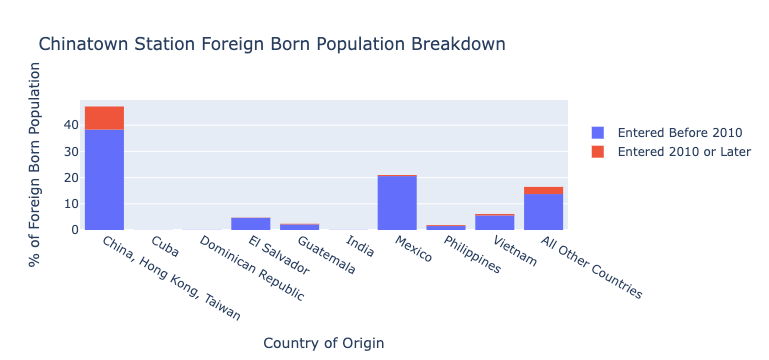

In [144]:
ctown_fig = px.bar(ctown_df_mini, x="Country of Origin", y=["Entered Before 2010", "Entered 2010 or Later"], 
                    title="Chinatown Station Foreign Born Population Breakdown", 
                    labels={'value':'% of Foreign Born Population', 'variable':' '
        })

# get rid of white lines inside the bars
ctown_fig.update_traces(marker_line_width=0)

# show the figure
ctown_fig.show()

Around Chinatown Station, we see mostly more established immigrants, and a relatively diverse group. Clearly the highest proportion of ethnicities are from China, Hong Kong, and Taiwan.

### Year of Entry: Chinatown Neighborhood Foreign Born Population

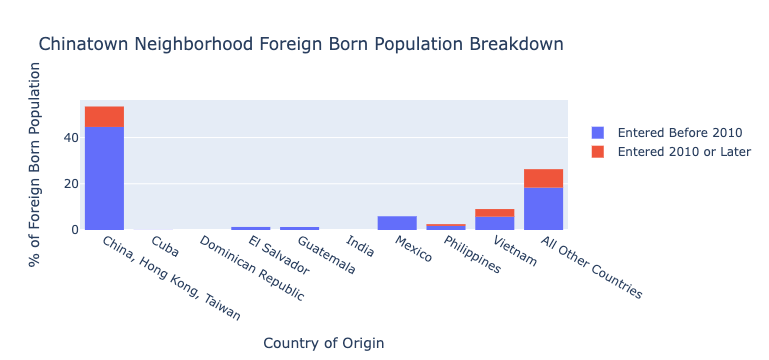

In [145]:
chinatown_fig = px.bar(chinatown_df_mini, x="Country of Origin", y=["Entered Before 2010", "Entered 2010 or Later"], 
                    title="Chinatown Neighborhood Foreign Born Population Breakdown", 
                    labels={'value':'% of Foreign Born Population', 'variable':' '
        })

# get rid of white lines inside the bars
chinatown_fig.update_traces(marker_line_width=0)

# show the figure
chinatown_fig.show()

The neighborhood at large tells a similar story to the station area, but with a lower share of Mexican, Salvadoran, and Guatemalan immigrants, suggesting that the station area has a higher concentration of immigrants from these countries.

### Year of Entry: Del Mar Station Foreign Born Population

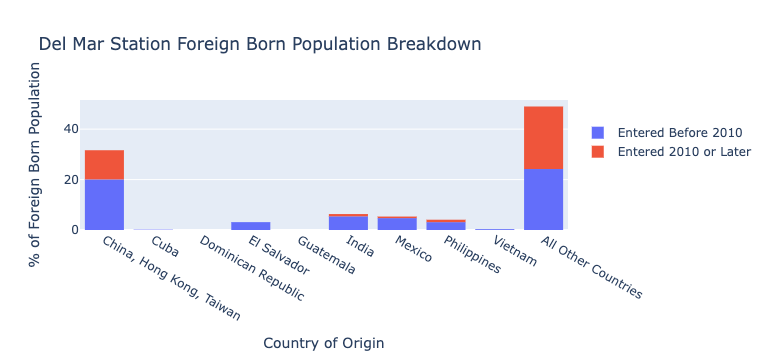

In [146]:
delmar_fig = px.bar(delmar_df_mini, x="Country of Origin", y=["Entered Before 2010", "Entered 2010 or Later"], 
                    title="Del Mar Station Foreign Born Population Breakdown", 
                    labels={'value':'% of Foreign Born Population', 'variable':' '
        })

# get rid of white lines inside the bars
delmar_fig.update_traces(marker_line_width=0)

# show the figure
delmar_fig.show()

The foreign born population around Del Mar Station looks quite different from Chinatown Station. A lower proportion of Chinese et al immigrants, but still a relatively high concentration, which is not surprising for the area. Additionally, we see a larger proportion of recent Chinese immgirants when compared to Chinatown. We think The most interesting aspect of this graph is the significant proportion of immigrants from other countries, especially the high number of those that have entered more recently than 2010.

### Year of Entry: Pasadena Foreign Born Population

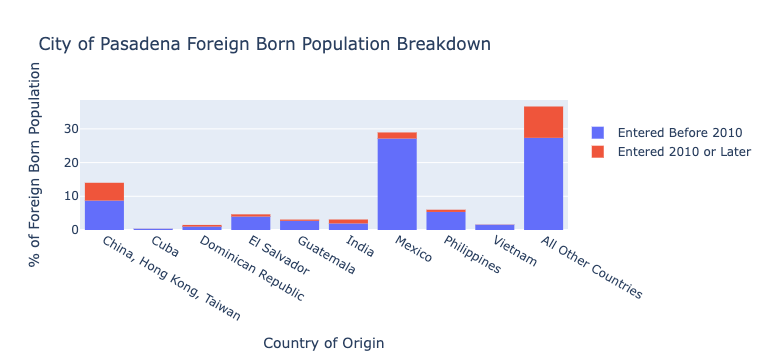

In [147]:
pasadena_fig = px.bar(pasadena_df_mini, x="Country of Origin", y=["Entered Before 2010", "Entered 2010 or Later"], 
                    title="City of Pasadena Foreign Born Population Breakdown", 
                    labels={'value':'% of Foreign Born Population', 'variable':' '}
                     )

# get rid of white lines inside the bars
pasadena_fig.update_traces(marker_line_width=0)

# show the figure
pasadena_fig.show()

The first thing that sticks out to us here is the significantly larger proportion of Mexican immigrants in the City of Pasadena when compared to the Del Mar Station area. We see higher numbers of Filipino and Vietnamese folks, while also an uptick in Central American and Caribbean folks. "All Other Countries" remains high, but relatively lower than Del Mar. The % of recent A.O.C immigrants is also lower than Del Mar station.

## Interactive Map of Foreign Born in Pasadena and Chinatown

We are interested in creating a map that shows the percent of foreign born in our entire neighborhoods, Chinatown and Pasadena.  

### Importing plotly

To create our interactive map, we'll use plotly.

In [148]:
# for interactive plots
import plotly.express as px

As a sidenote, we originally wanted our interactive map to show the percent foreign born for <strong><em>each</em></strong> ethnicity in our neighborhood census tracts. After tirelessly searching on stackoverflow, the plotly website, and other online resources, we found no method to successfully include more than one datapoint to a hover text box. For now, we leave the code we wrote that calculates the percent foreign born of each ethnicity for LA County census tracts with the intention of using it in the future.

In [149]:
Per_ChinaEtAl = (df['China, Hong Kong, Taiwan']/df['Total Population'])*100
Per_Cuba = (df['Cuba']/df['Total Population'])*100
Per_Dominican = (df['Dominican Republic']/df['Total Population'])*100
Per_ElSalvador = (df['El Salvador']/df['Total Population'])*100
Per_Guatemala = (df['Guatemala']/df['Total Population'])*100
Per_India = (df['India']/df['Total Population'])*100
Per_Mexico = (df['Mexico']/df['Total Population'])*100
Per_Philippines = (df['Philippines']/df['Total Population'])*100
Per_Vietnam = (df['Vietnam']/df['Total Population'])*100
Per_AOC = (df['All Other Countries']/df['Total Population'])*100

In [150]:
df['% China, et al'] = Per_ChinaEtAl
df['% Cuba'] = Per_Cuba
df['% Dominican'] = Per_Dominican
df['% El Salvador'] = Per_ElSalvador
df['% Guatemala'] = Per_Guatemala
df['% India'] = Per_India
df['% Mexico'] = Per_Mexico
df['% Philippines'] = Per_Philippines
df['% Vietnam'] = Per_Vietnam
df['% AOC'] = Per_AOC

Now, let's continue using "percent foreign born" to create our interactive map of Pasadena and Chinatown. 

### Pasadena: Foreign Born Interactive Map

To map out the City of Pasadena, we first create a subset of our main dataframe consisting of only Pasadena census tracts. 

In [151]:
Pasadena = df[df["geoid"].isin(['14000US06037460401',
                                    '14000US06037460800',
                                    '14000US06037463800', 
                                    '14000US06037463900', 
                                    '14000US06037464000', 
                                    '14000US06037463500', 
                                    '14000US06037463400', 
                                    '14000US06037463200', 
                                    '14000US06037462900', 
                                    '14000US06037463000', 
                                    '14000US06037462500', 
                                    '14000US06037461400', 
                                    '14000US06037461501', 
                                    '14000US06037461502', 
                                    '14000US06037460900', 
                                    '14000US06037460401', 
                                    '14000US06037461700', 
                                    '14000US06037461600', 
                                    '14000US06037462002', 
                                    '14000US06037462001', 
                                    '14000US06037462100', 
                                    '14000US06037462400', 
                                    '14000US06037462600', 
                                    '14000US06037462800', 
                                    '14000US06037462700', 
                                    '14000US06037462301', 
                                    '14000US06037462302', 
                                    '14000US06037462201', 
                                    '14000US06037462202', 
                                    '14000US06037461901', 
                                    '14000US06037461902', 
                                    '14000US06037463700', 
                                    '14000US06037463602',
                                    '14000US06037463601']
                                      )
                     ]

Now we drop our new Pasadena variable into a plotly interactive choropleth map. 

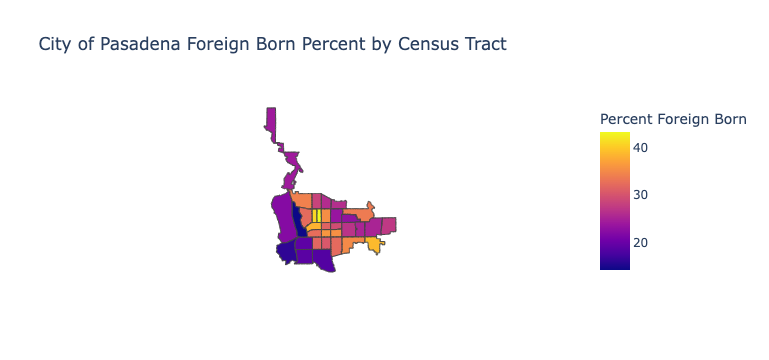

In [152]:
fig = px.choropleth(Pasadena,
                   geojson=Pasadena.geometry,
                   locations=Pasadena.index,
                   color="Percent Foreign Born",
                   projection="mercator",
                   title="City of Pasadena Foreign Born Percent by Census Tract")
fig.update_geos(fitbounds="locations", visible=False)
fig.show()

Note the low percent foreign born population in west Pasadena. This area is west of our station area. To the north of our station area is where the highest population of foreign born residents live. It will be interesting to see how this map compares to our 2011 ACS data. 

### Chinatown: Foreign Born Interactive Map

Once again, we begin by creating a subset of only census tracts within our neighborhood. In this case, it is Chinatown. 

In [153]:
Chinatown = df[df["geoid"].isin(['14000US06037207101', 
                                       '14000US06037207103', 
                                       '14000US06037207102']
                                      )
                     ]

Chinatown is so small that it actually consists of one less census tract than our walkshed. The census tract with the low percentage of foreign born residents we discussed earlier is technically not in Chinatown. As a preview, check out the shape of Chinatown below. It  has all the census tracts entact from our walkshed except for the southern census tract. 

<AxesSubplot:>

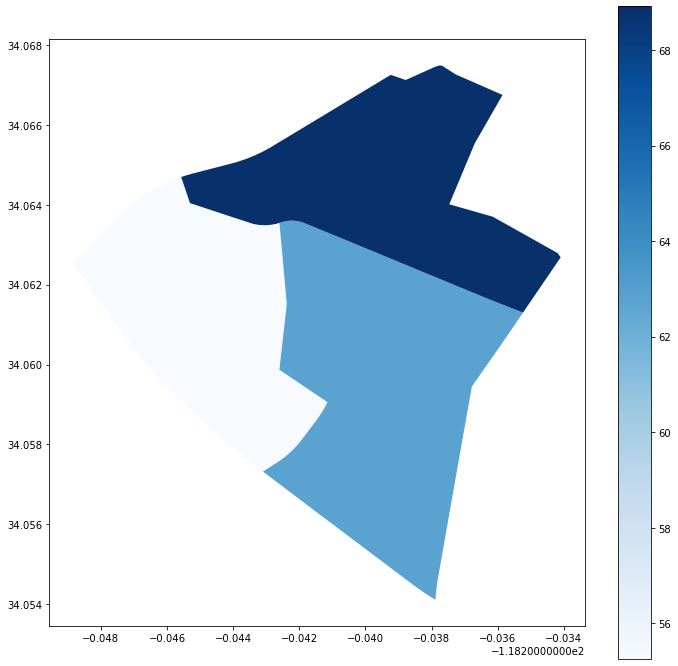

In [154]:
fig,ax = plt.subplots(figsize=(12,12))

Chinatown.plot(ax=ax,column='Percent Foreign Born', legend=True,cmap='Blues')

Now to add an interactive element. We are going to add hover text so that the percent foreign born of each census tract will pop up.

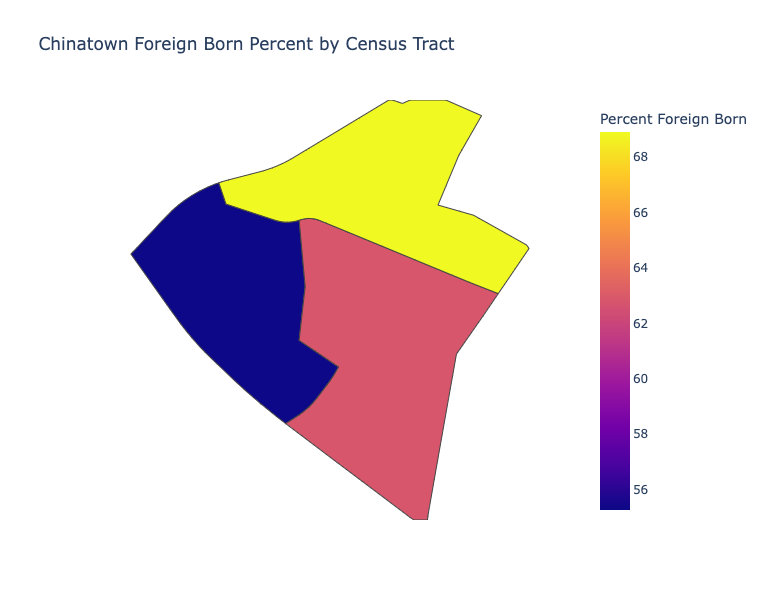

In [157]:
fig = px.choropleth(Chinatown,
                   geojson=Chinatown.geometry,
                   locations=Chinatown.index,
                   color="Percent Foreign Born",
                   projection="mercator",
                   width=600,
                   height=600,
                   hover_data=['% Mexico', '% AOC'],
                   title="Chinatown Foreign Born Percent by Census Tract")
fig.update_geos(fitbounds="locations", visible=False)
fig.show()

This map allows us to read the exact percentage foreign born in each census tract by placing your cursor over it. It gives us more exact statistics than a static map. Considering our three Chinatown census tracts are at least 50% foreign born, it'll be interesting to see how these rates compare to the 2011 ACS survey. 

### Arroyo Seco Collective

Erik: Chinatown Station walkshed, isochrone mapping, interactive mapping, code proofreading

Kevin: Del Mar Station walk shed, plotly charting, final midterm notebook construction, code proofreading